# Bibliotecas

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
import seaborn as sns
from IPython.display import Image
from matplotlib.gridspec import GridSpec
from scipy.special import boxcox1p
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import Lasso, ElasticNet
from sklearn.kernel_ridge import KernelRidge
from sklearn.preprocessing import normalize, MinMaxScaler
from sklearn.compose import TransformedTargetRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression

# Coleta

In [2]:
df = pd.read_csv("insurance.csv")

In [3]:
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [4]:
df.shape

(1338, 7)

In [5]:
df.dtypes

age           int64
sex          object
bmi         float64
children      int64
smoker       object
region       object
charges     float64
dtype: object

# Separação de treino e teste

In [7]:
x = df.loc[:, ~df.columns.isin(['charges'])]
y = df[['charges']]

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)

train = x_train.merge(y_train, left_index=True, right_index=True)
test = x_test.merge(y_test, left_index=True, right_index=True)

# Variáveis

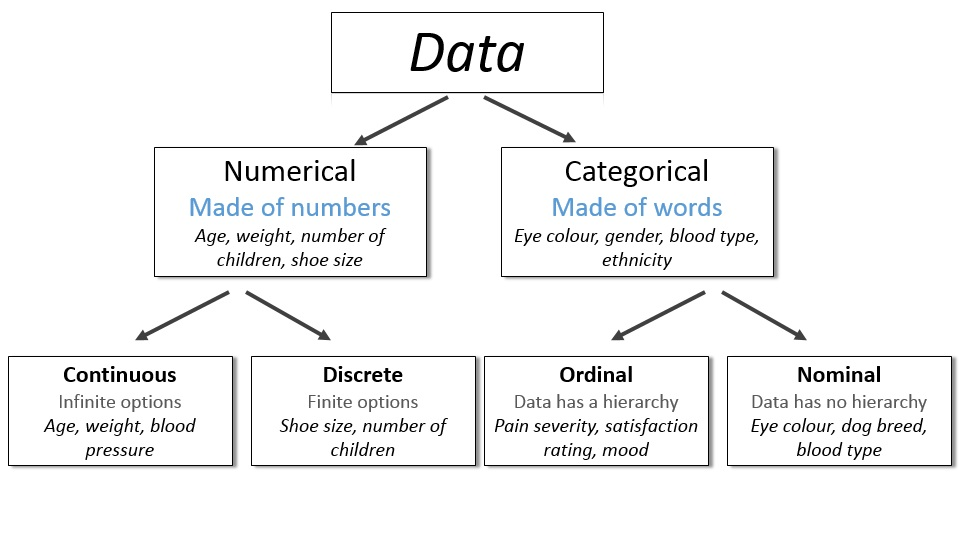

In [8]:
Image("image.png")

In [ ]:
continuous = ["bmi"]
discrete = ["age", "children"]
nominal = ["sex", "smoker", "region"]

# Análise Exploratória e Limpeza de Dados

## bmi

In [ ]:
BMI Categories:
Underweight = <18.5
Normal weight = 18.5–24.9
Overweight = 25–29.9
Obesity = BMI of 30 or greater 

In [9]:
x_train["obesity"] = x_train["bmi"].apply(lambda x: 1 if x >= 30 else 0)
x_test["obesity"] = x_test["bmi"].apply(lambda x: 1 if x >= 30 else 0)
train["obesity"] = train["bmi"].apply(lambda x: 1 if x >= 30 else 0)

In [10]:
train["bmi"].isnull().sum(), test["bmi"].isnull().sum()

(np.int64(0), np.int64(0))

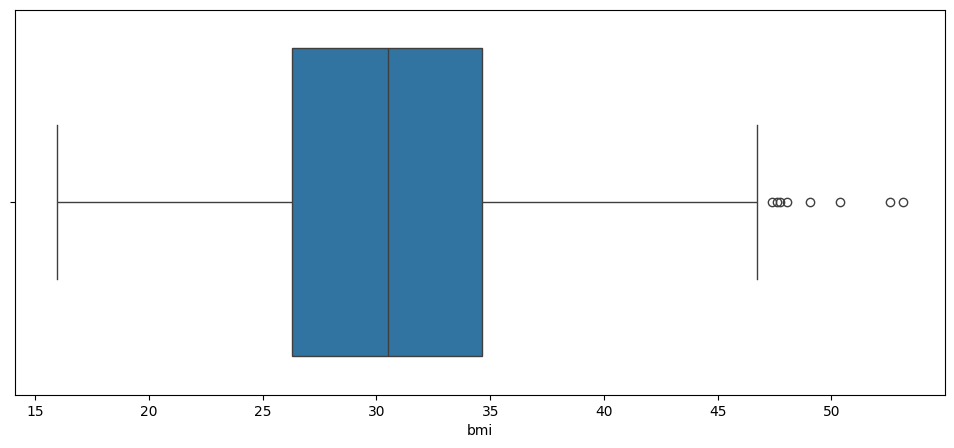

In [11]:
fig = plt.figure(figsize=(12,5))
sns.boxplot(train["bmi"], orient="h")
plt.show()

In [12]:
train[train["bmi"]>=47]

,age,sex,bmi,children,smoker,region,charges,obesity
286,46,female,48.07,2,no,northeast,9432.92530,1
1047,22,male,52.58,1,yes,southeast,44501.39820,1
860,37,female,47.60,2,yes,southwest,46113.51100,1
543,54,female,47.41,0,yes,southeast,63770.42801,1
116,58,male,49.06,0,no,southeast,11381.32540,1
1317,18,male,53.13,0,no,southeast,1163.46270,1
1088,52,male,47.74,1,no,southeast,9748.91060,1
847,23,male,50.38,1,no,southeast,2438.05520,1


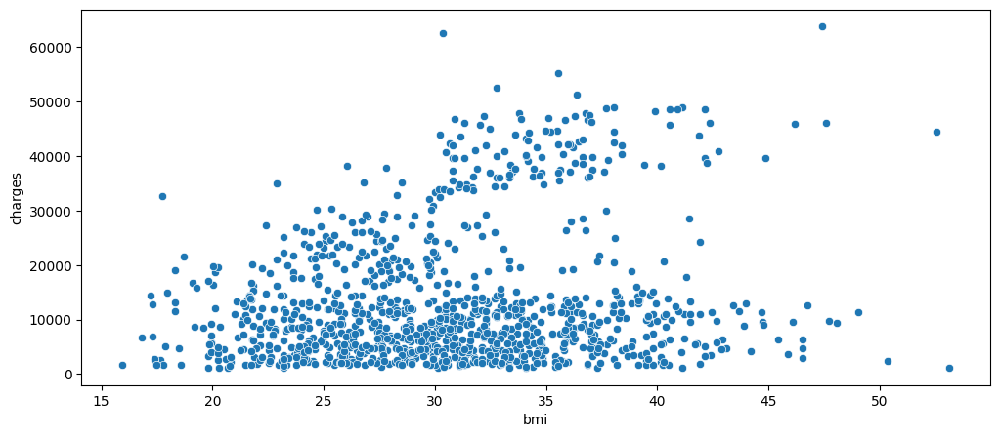

In [13]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["bmi"])
plt.show()

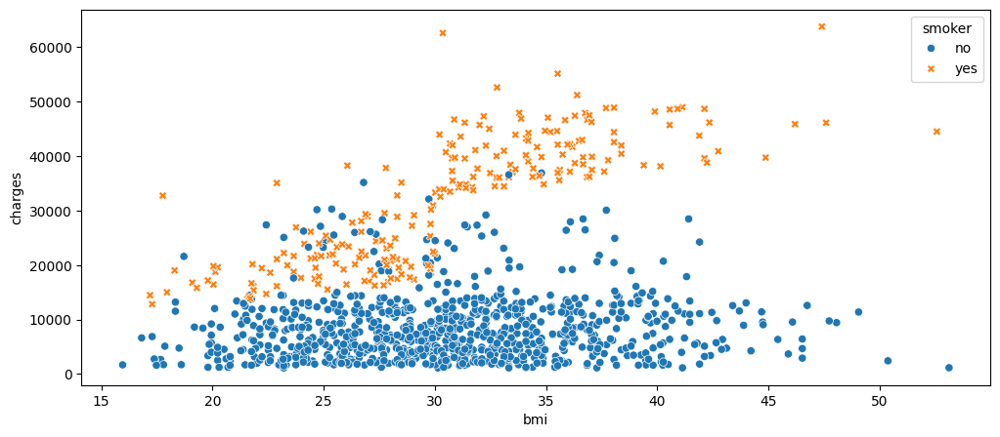

In [14]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["bmi"], hue=train["smoker"], style=train["smoker"])
plt.show()

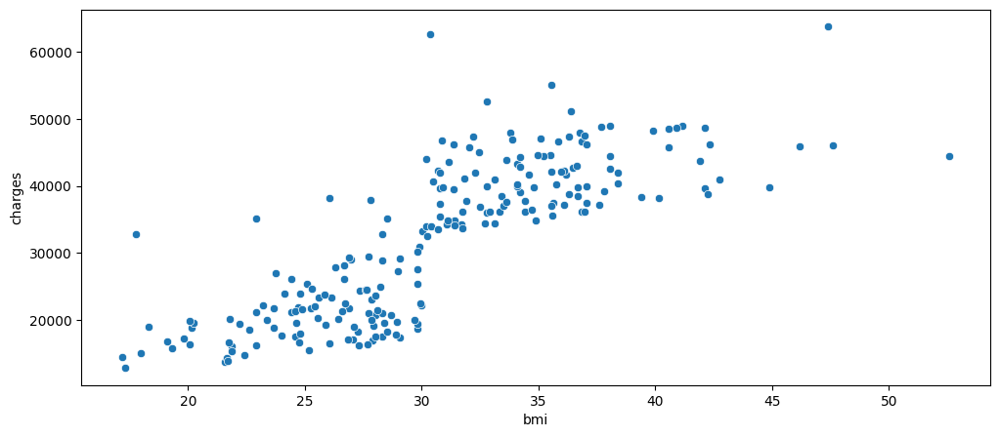

In [15]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(data=train[train['smoker']=='yes'], y='charges', x='bmi')
plt.show()

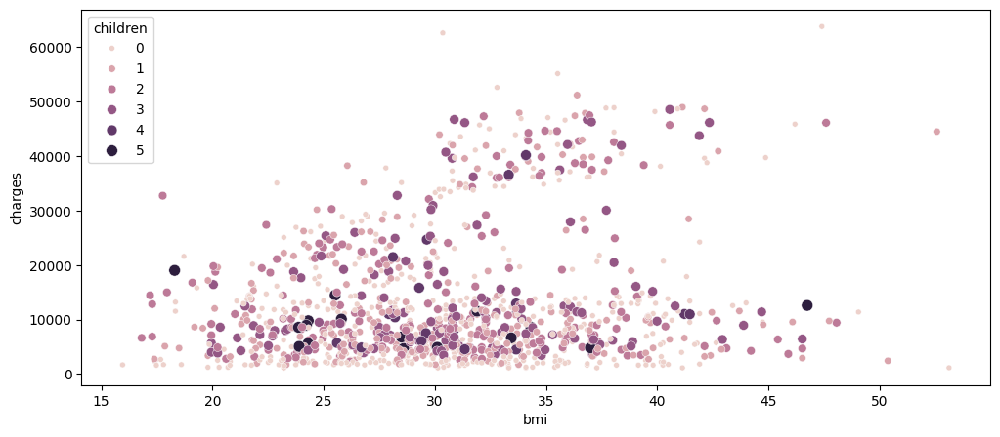

In [16]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["bmi"], hue=train["children"], size=train["children"])
plt.show()

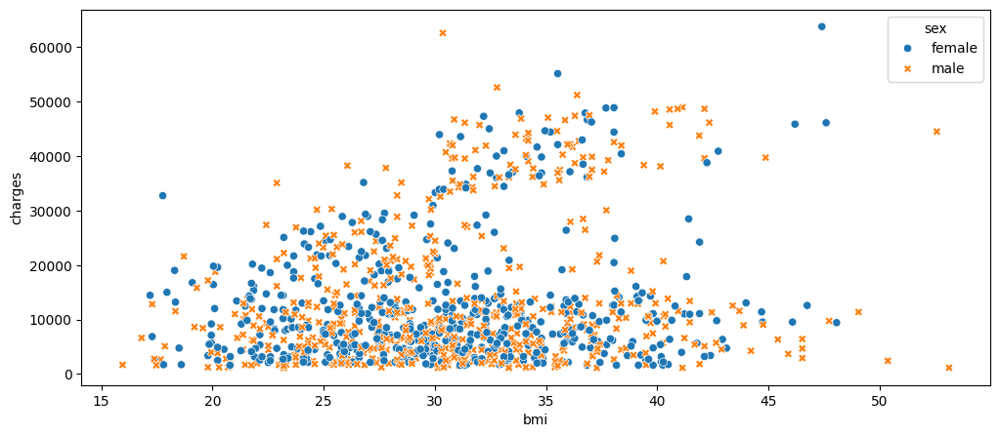

In [17]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["bmi"], hue=train["sex"], style=train["sex"])
plt.show()

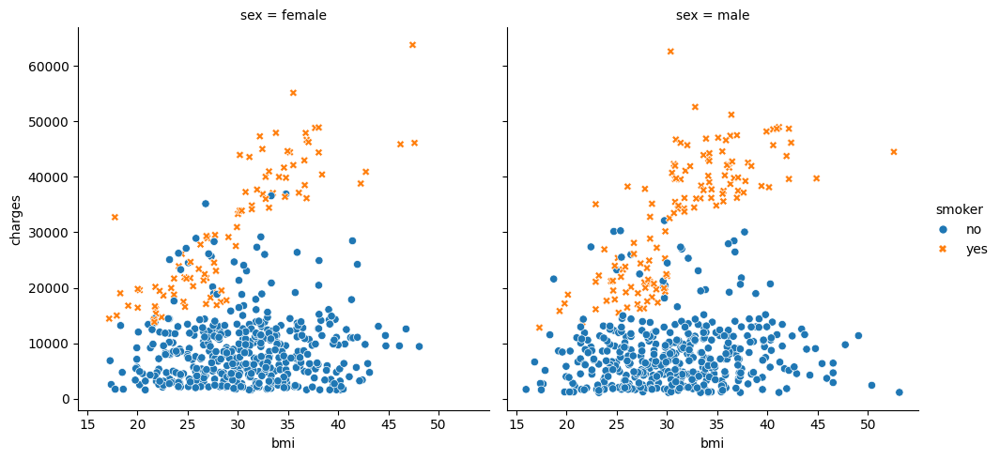

In [18]:
sns.relplot(y=train.charges, x=train["bmi"], hue=train["smoker"], style=train["smoker"], col=train["sex"], kind="scatter")
plt.show()

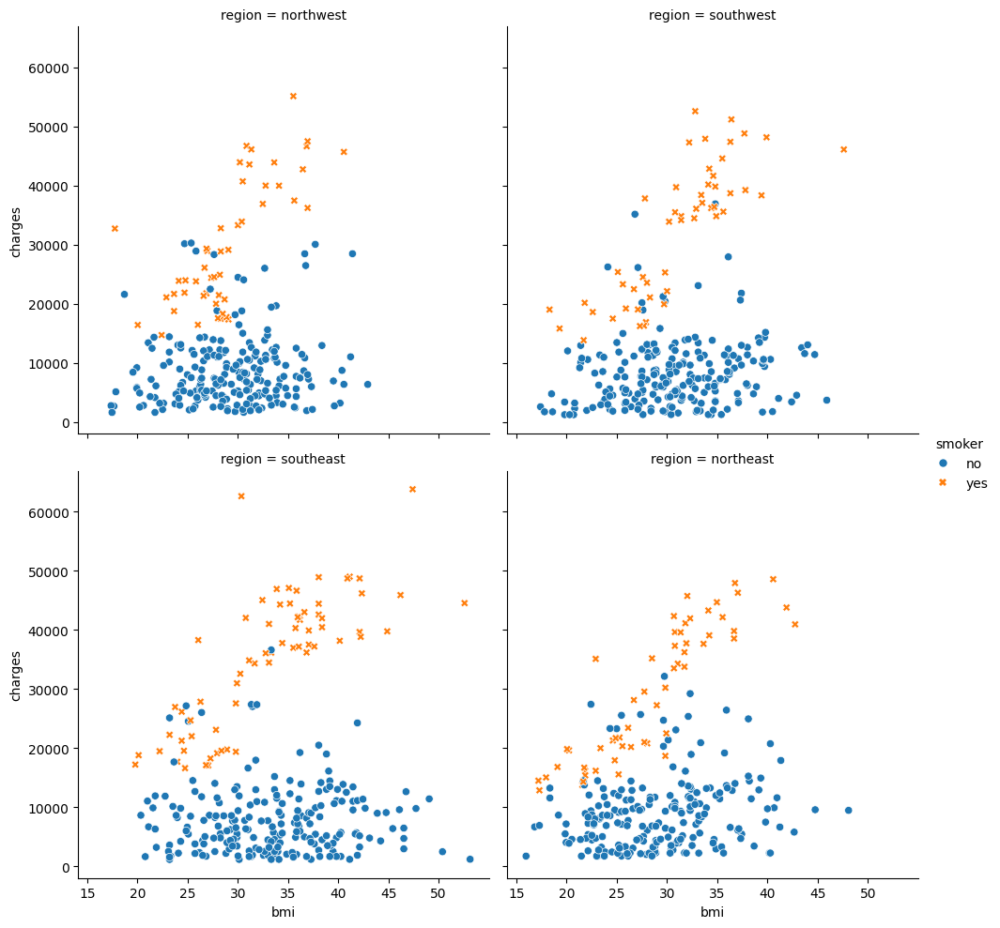

In [19]:
sns.relplot(y=train.charges, x=train["bmi"], hue=train["smoker"], style=train["smoker"], col=train["region"], kind="scatter", col_wrap=2)
plt.show()

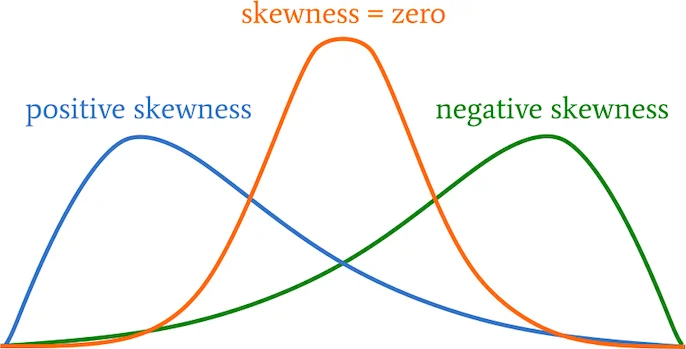

In [20]:
Image("skewness.png")

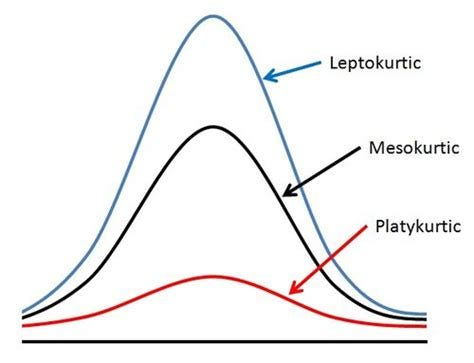

In [21]:
Image("kurtosis.jpg")

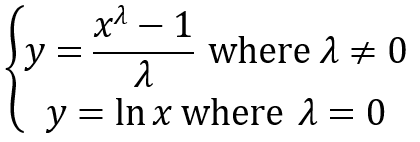

In [22]:
Image("box_cox.png")

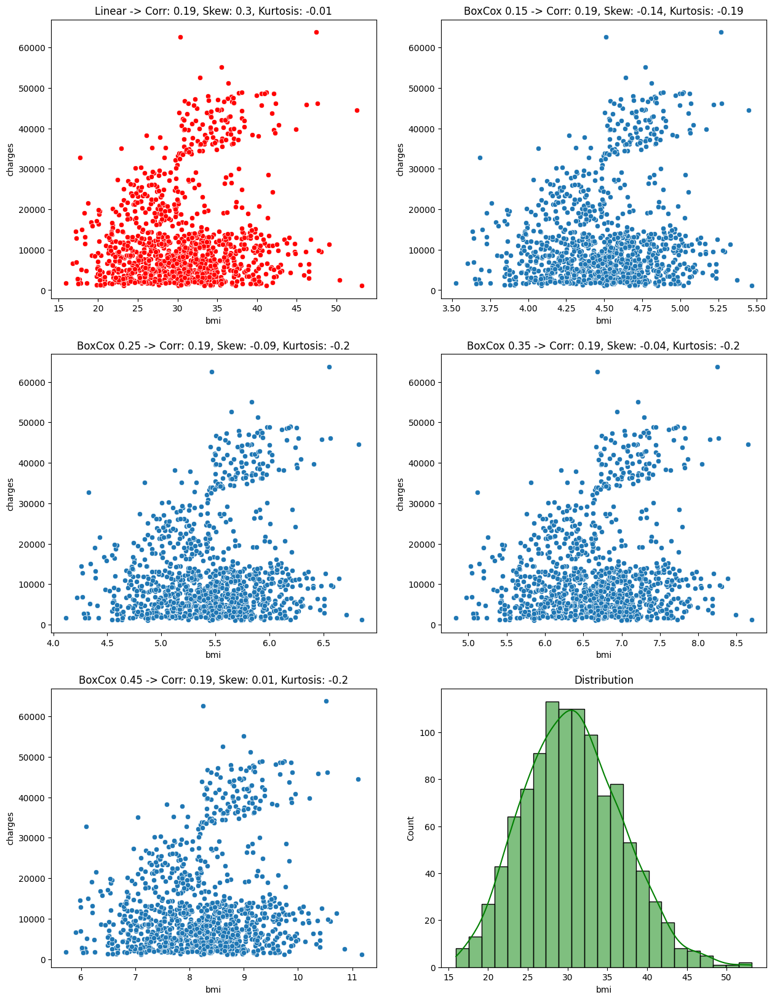

In [23]:
fig = plt.figure(figsize=(15,20))
gs = GridSpec(3,2)

j = sns.scatterplot(y=train['charges'], 
                    x=train["bmi"], ax=fig.add_subplot(gs[0,0]), color = 'red')
plt.title('Linear -> ' + 'Corr: ' + str(np.round(train['charges'].corr(train["bmi"]),2)) + ', Skew: ' + 
           str(np.round(stats.skew(train["bmi"], nan_policy='omit'),2)) + ', Kurtosis: ' + str(np.round(stats.kurtosis(train["bmi"], nan_policy='omit'),2)))

j = sns.scatterplot(y=train['charges'], 
                    x=boxcox1p(train["bmi"], 0.15), ax=fig.add_subplot(gs[0,1]))
plt.title('BoxCox 0.15 -> ' + 'Corr: ' + str(np.round(train['charges'].corr(boxcox1p(train["bmi"], 0.15)),2)) +
          ', Skew: ' + str(np.round(stats.skew(boxcox1p(train["bmi"], 0.15), nan_policy='omit'),2)) + ', Kurtosis: ' + str(np.round(stats.kurtosis(boxcox1p(train["bmi"],0.15), nan_policy='omit'),2)))

j = sns.scatterplot(y=train['charges'], 
                    x=boxcox1p(train["bmi"], 0.25), ax=fig.add_subplot(gs[1,0]))
plt.title('BoxCox 0.25 -> ' + 'Corr: ' + str(np.round(train['charges'].corr(boxcox1p(train["bmi"], 0.25)),2)) +
          ', Skew: ' + str(np.round(stats.skew(boxcox1p(train["bmi"], 0.25), nan_policy='omit'),2)) + ', Kurtosis: ' + str(np.round(stats.kurtosis(boxcox1p(train["bmi"],0.25), nan_policy='omit'),2)))

j = sns.scatterplot(y=train['charges'], 
                    x=boxcox1p(train["bmi"], 0.35), ax=fig.add_subplot(gs[1,1]))
plt.title('BoxCox 0.35 -> ' + 'Corr: ' + str(np.round(train['charges'].corr(boxcox1p(train["bmi"], 0.35)),2)) +
          ', Skew: ' + str(np.round(stats.skew(boxcox1p(train["bmi"], 0.35), nan_policy='omit'),2)) + ', Kurtosis: ' + str(np.round(stats.kurtosis(boxcox1p(train["bmi"],0.35), nan_policy='omit'),2)))

j = sns.scatterplot(y=train['charges'], 
                    x=boxcox1p(train["bmi"], 0.45), ax=fig.add_subplot(gs[2,0]))
plt.title('BoxCox 0.45 -> ' + 'Corr: ' + str(np.round(train['charges'].corr(boxcox1p(train["bmi"], 0.45)),2)) +
          ', Skew: ' + str(np.round(stats.skew(boxcox1p(train["bmi"], 0.45), nan_policy='omit'),2)) + ', Kurtosis: ' + str(np.round(stats.kurtosis(boxcox1p(train["bmi"],0.45), nan_policy='omit'),2)))

j = sns.histplot(train["bmi"], ax=fig.add_subplot(gs[2,1]), color = 'green', kde=True)
plt.title('Distribution')

plt.show()

The values for asymmetry and kurtosis between -2 and +2 are considered acceptable in order to prove normal univariate distribution (George & Mallery, 2010). George, D., & Mallery, M. (2010). SPSS for Windows Step by Step: A Simple Guide and Reference, 17.0 update (10a ed.) Boston: Pearson.

In [25]:
x_train["bmi"] = boxcox1p(x_train["bmi"], 0.45)
x_test["bmi"] = boxcox1p(x_test["bmi"], 0.45)

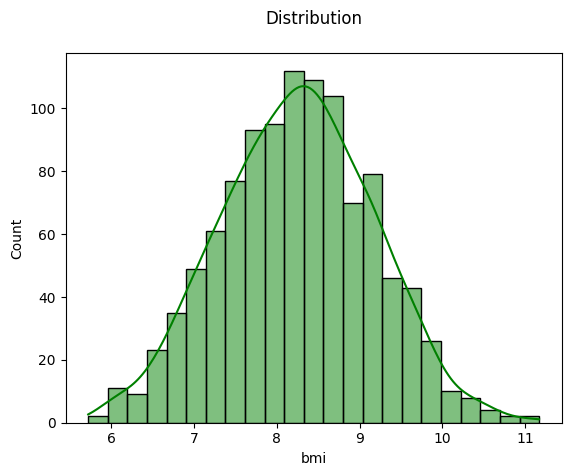

In [26]:
sns.histplot(x_train["bmi"], color = 'green', kde=True)
plt.title('Distribution\n')
plt.show()

## age

In [27]:
train["age"].isnull().sum(), test["age"].isnull().sum()

(np.int64(0), np.int64(0))

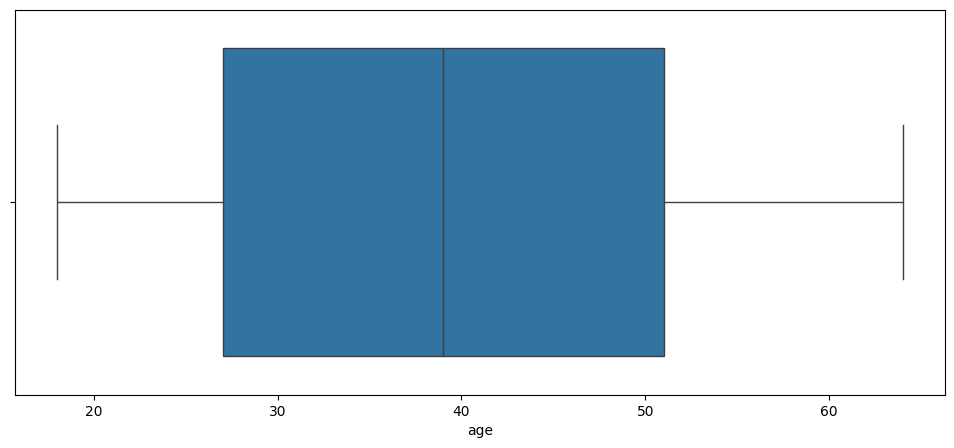

In [28]:
fig = plt.figure(figsize=(12,5))
sns.boxplot(train["age"], orient="h")
plt.show()

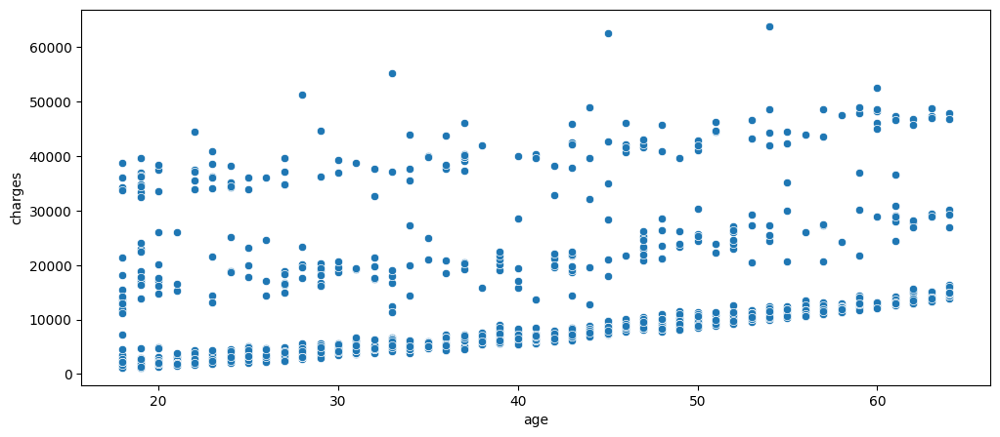

In [29]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["age"])
plt.show()

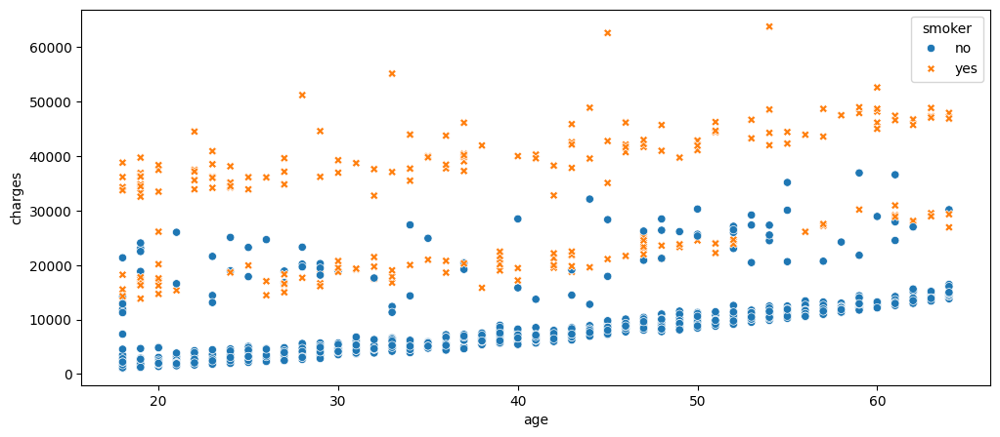

In [30]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["age"], hue=train["smoker"], style=train["smoker"])
plt.show()

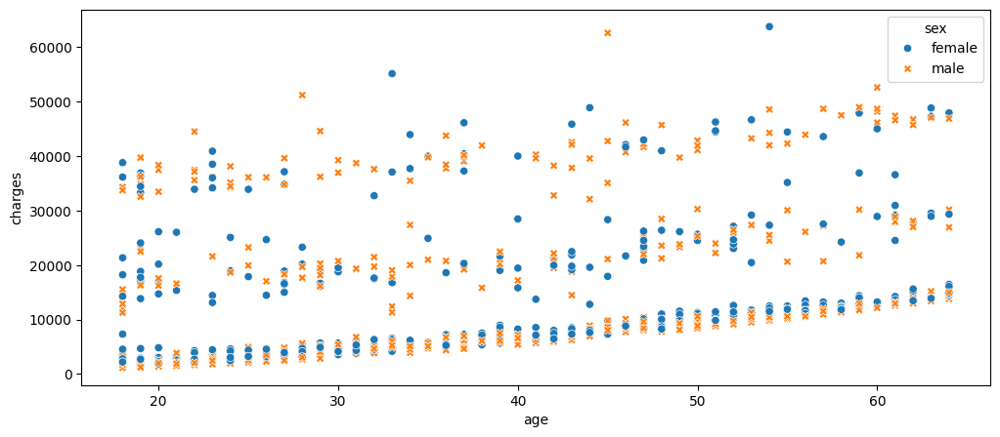

In [31]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["age"], hue=train["sex"], style=train["sex"])
plt.show()

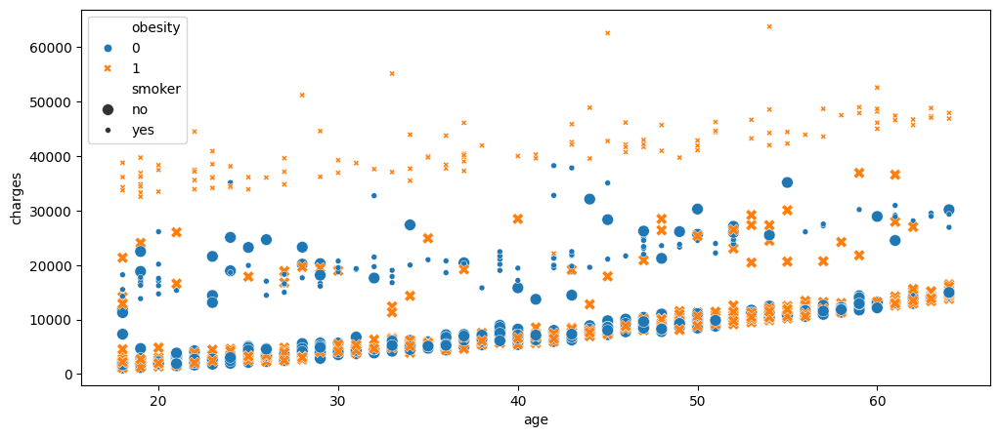

In [32]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["age"], hue=train["obesity"], style=train["obesity"], size=train["smoker"])
plt.show()

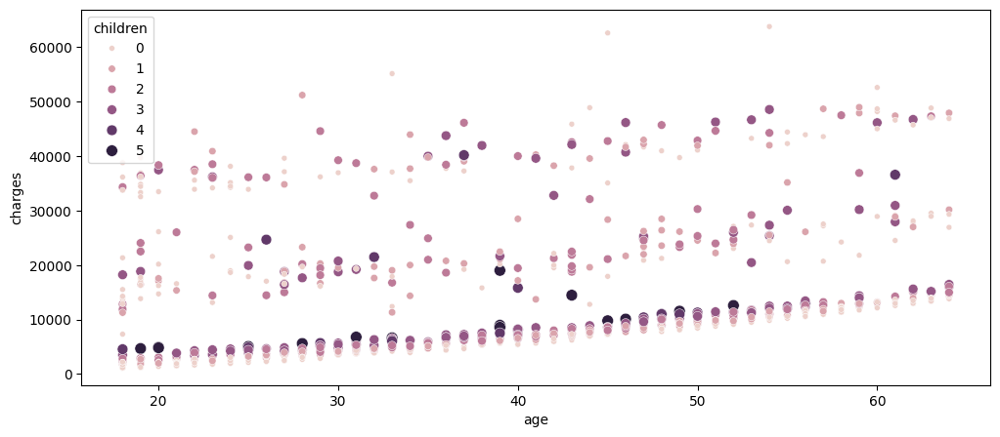

In [33]:
fig = plt.figure(figsize=(12,5))
sns.scatterplot(y=train.charges, x=train["age"], hue=train["children"], size=train["children"])
plt.show()

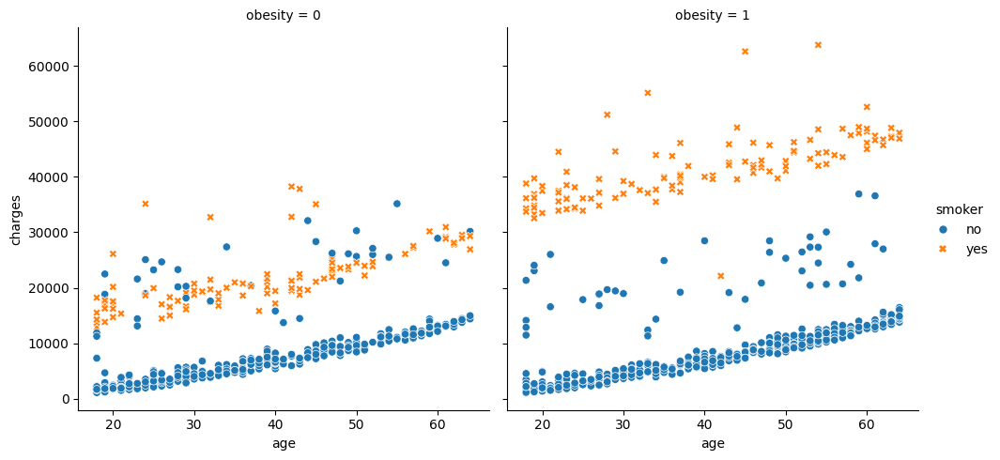

In [34]:
sns.relplot(y=train.charges, x=train["age"], hue=train["smoker"], style=train["smoker"], col=train["obesity"], kind="scatter")
plt.show()

In [35]:
train[(train.obesity == 1) & (train.smoker == "yes")].sort_values("charges", ascending=True)

,age,sex,bmi,children,smoker,region,charges,obesity
461,42,male,30.000,0,yes,southwest,22144.03200,1
503,19,male,30.250,0,yes,southeast,32548.34050,1
1196,19,female,30.020,0,yes,northwest,33307.55080,1
1042,20,male,30.685,0,yes,northeast,33475.81715,1
911,18,male,31.730,0,yes,northeast,33732.68670,1
...,...,...,...,...,...,...,...,...
34,28,male,36.400,1,yes,southwest,51194.55914,1
1146,60,male,32.800,0,yes,southwest,52590.82939,1
819,33,female,35.530,0,yes,northwest,55135.40209,1
1300,45,male,30.360,0,yes,southeast,62592.87309,1


In [36]:
i =  train[train.charges == 22144.03200].index

In [37]:
x_train.drop(i, inplace=True)
y_train.drop(i, inplace=True)
train.drop(i, inplace=True)

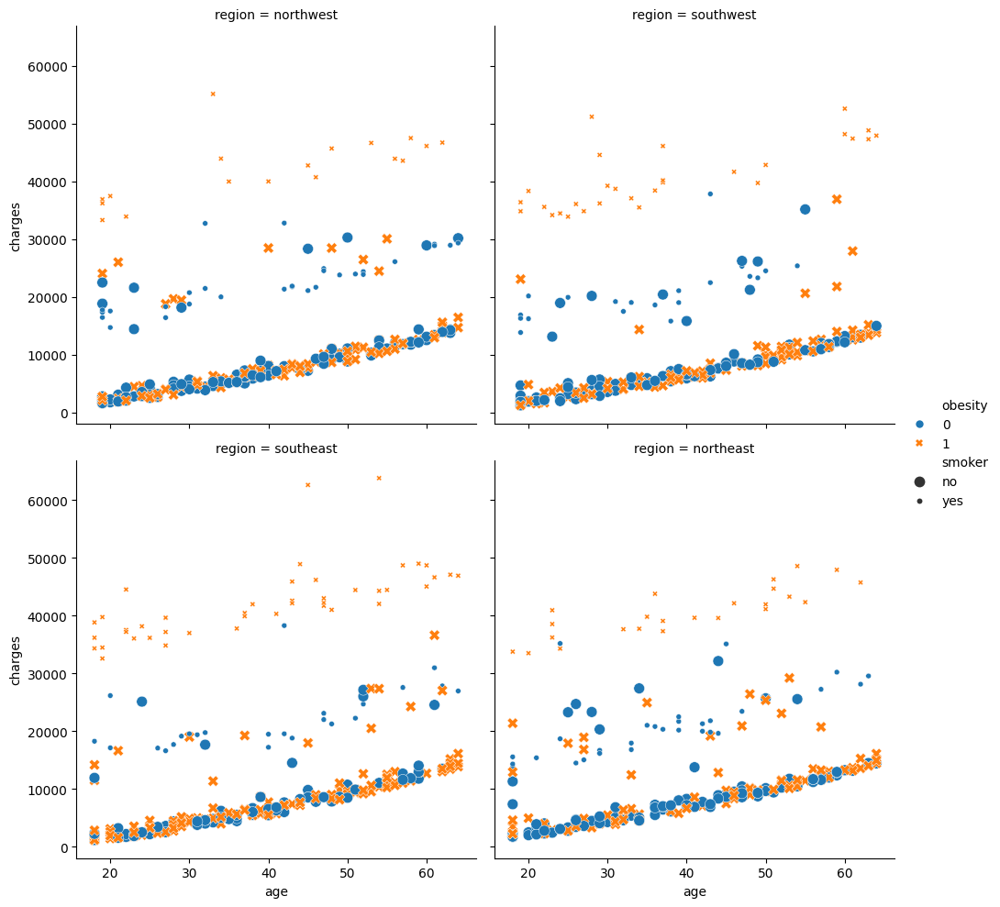

In [38]:
sns.relplot(y=train.charges, x=train["age"], hue=train["obesity"], style=train["obesity"], col=train["region"], kind="scatter", 
            size=train["smoker"], col_wrap=2)
plt.show()

## children

In [39]:
train["children"].isnull().sum(), test["children"].isnull().sum()

(np.int64(0), np.int64(0))

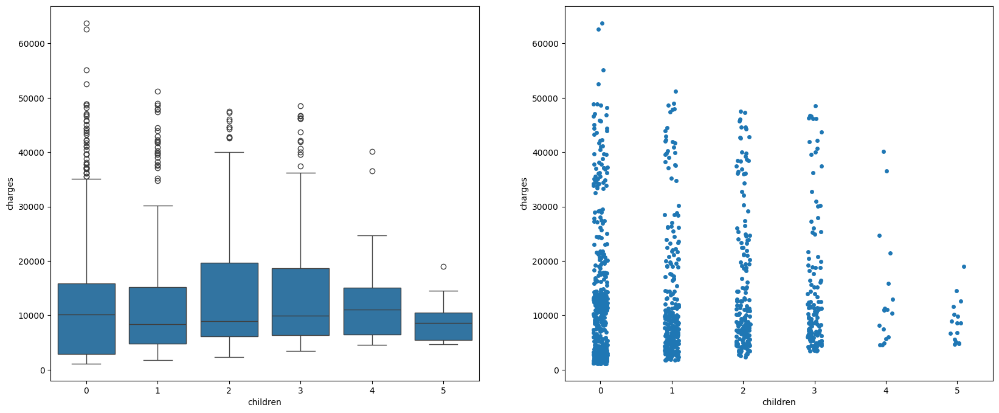

In [40]:
fig = plt.figure(figsize=(20,8))
gs = GridSpec(1,2)
sns.boxplot(y=train.charges, x=train["children"], ax=fig.add_subplot(gs[0,0]))
sns.stripplot(y=train.charges, x=train["children"], ax=fig.add_subplot(gs[0,1]))
plt.show()

In [41]:
x_train["children"] = x_train["children"].apply(lambda x: 3 if x > 3 else x)
x_test["children"] = x_test["children"].apply(lambda x: 3 if x > 3 else x)

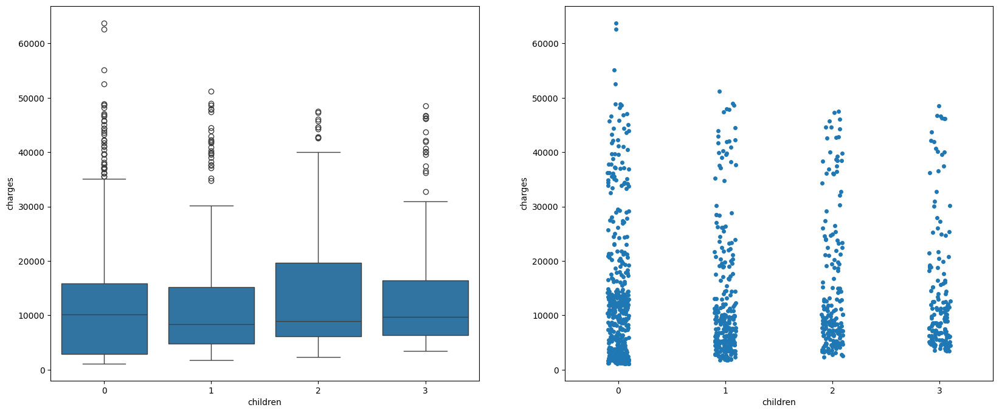

In [42]:
fig = plt.figure(figsize=(20,8))
gs = GridSpec(1,2)
sns.boxplot(y=train.charges, x=x_train["children"], ax=fig.add_subplot(gs[0,0]))
sns.stripplot(y=train.charges, x=x_train["children"], ax=fig.add_subplot(gs[0,1]))
plt.show()

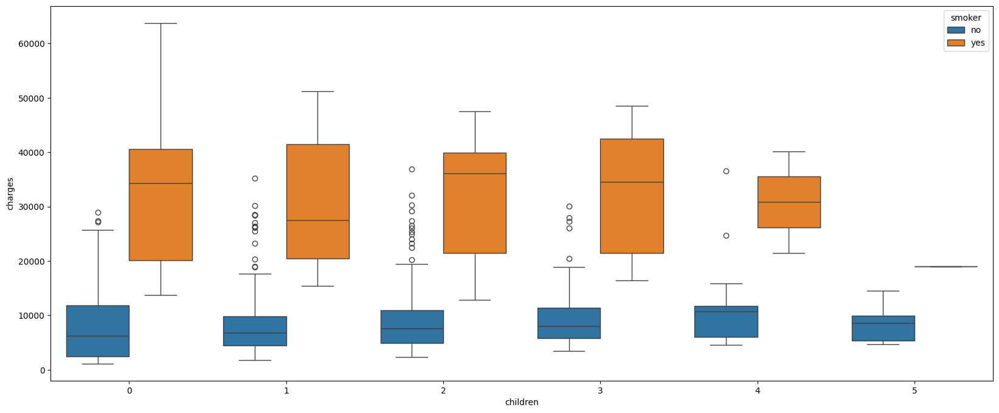

In [43]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["children"], hue=train["smoker"])
plt.show()

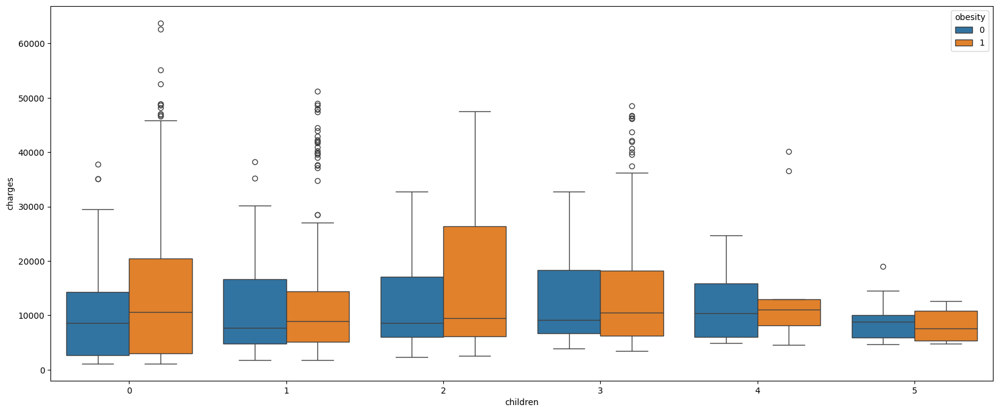

In [44]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["children"], hue=train["obesity"])
plt.show()

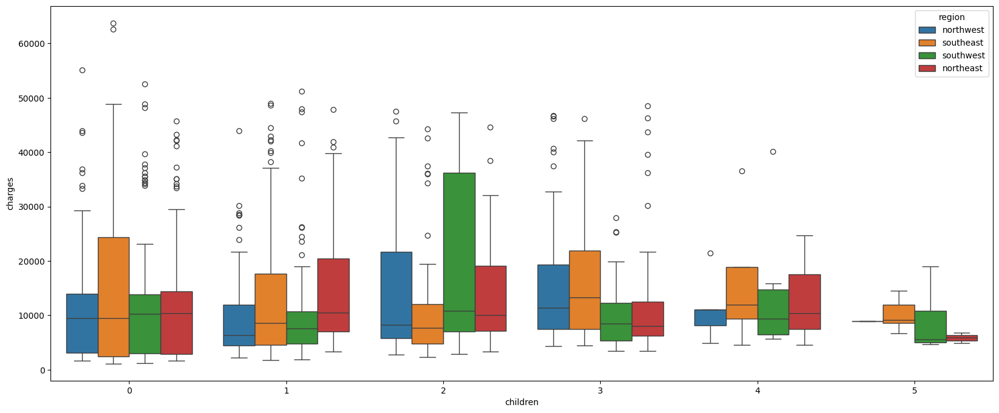

In [45]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["children"], hue=train["region"])
plt.show()

## sex

In [46]:
train["sex"].isnull().sum(), test["sex"].isnull().sum()

(np.int64(0), np.int64(0))

In [47]:
train["sex"].value_counts()

sex
male      544
female    525
Name: count, dtype: int64

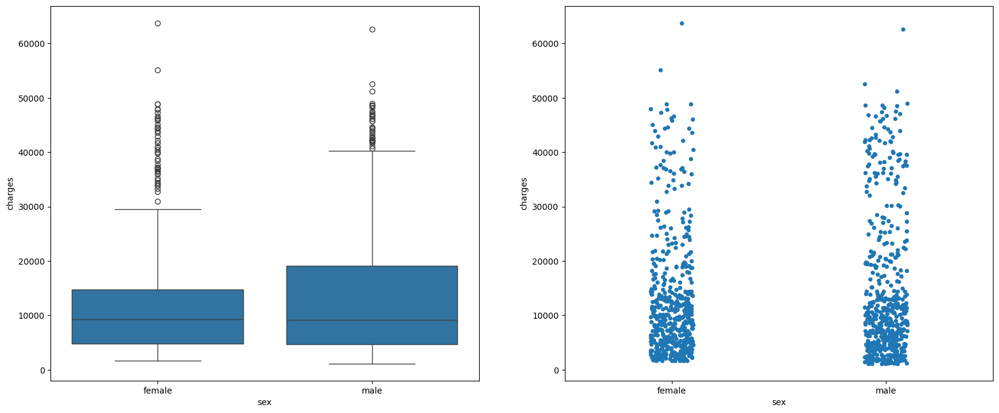

In [48]:
fig = plt.figure(figsize=(20,8))
gs = GridSpec(1,2)
sns.boxplot(y=train.charges, x=train["sex"], ax=fig.add_subplot(gs[0,0]))
sns.stripplot(y=train.charges, x=train["sex"], ax=fig.add_subplot(gs[0,1]))
plt.show()

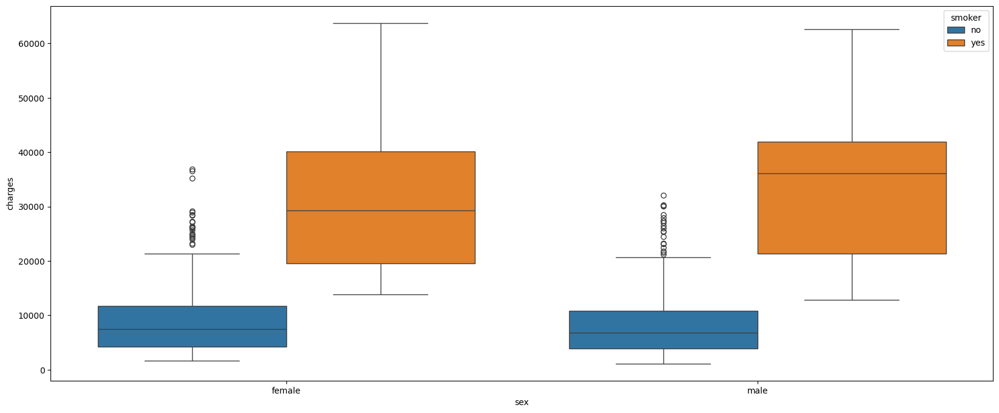

In [49]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["sex"], hue=train["smoker"])
plt.show()

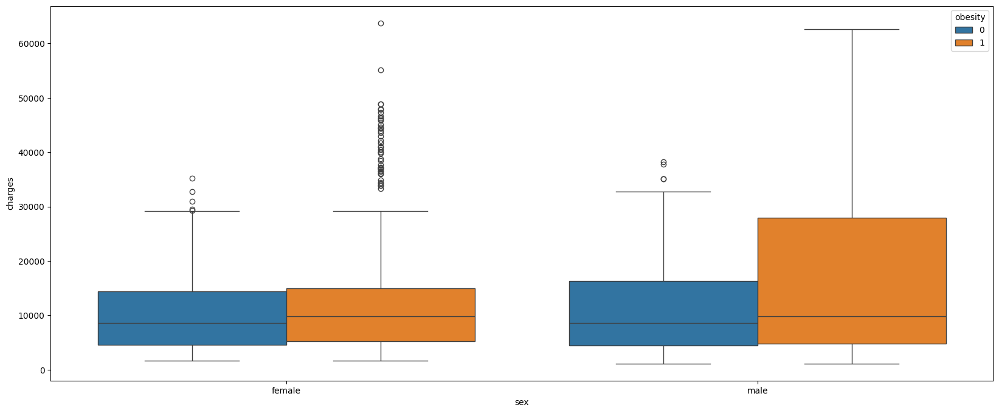

In [50]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["sex"], hue=train["obesity"])
plt.show()

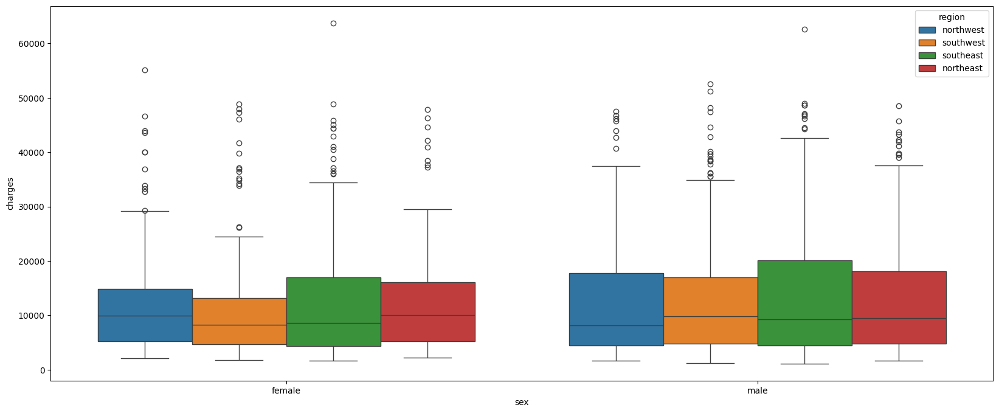

In [51]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["sex"], hue=train["region"])
plt.show()

In [52]:
x_train["sex"] = x_train["sex"].apply(lambda x: 1 if x == "male" else 0)
x_test["sex"] = x_test["sex"].apply(lambda x: 1 if x == "male" else 0)

## smoker

In [53]:
train["smoker"].isnull().sum(), test["smoker"].isnull().sum()

(np.int64(0), np.int64(0))

In [54]:
train["smoker"].value_counts()

smoker
no     850
yes    219
Name: count, dtype: int64

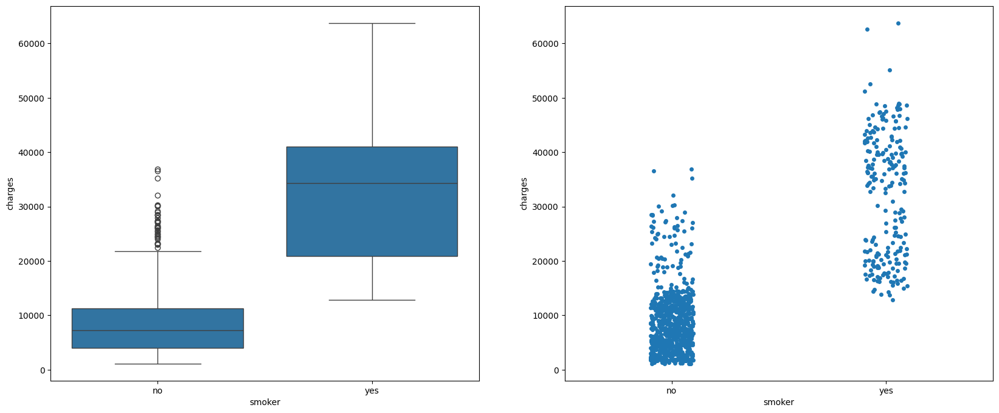

In [55]:
fig = plt.figure(figsize=(20,8))
gs = GridSpec(1,2)
sns.boxplot(y=train.charges, x=train["smoker"], ax=fig.add_subplot(gs[0,0]))
sns.stripplot(y=train.charges, x=train["smoker"], ax=fig.add_subplot(gs[0,1]))
plt.show()

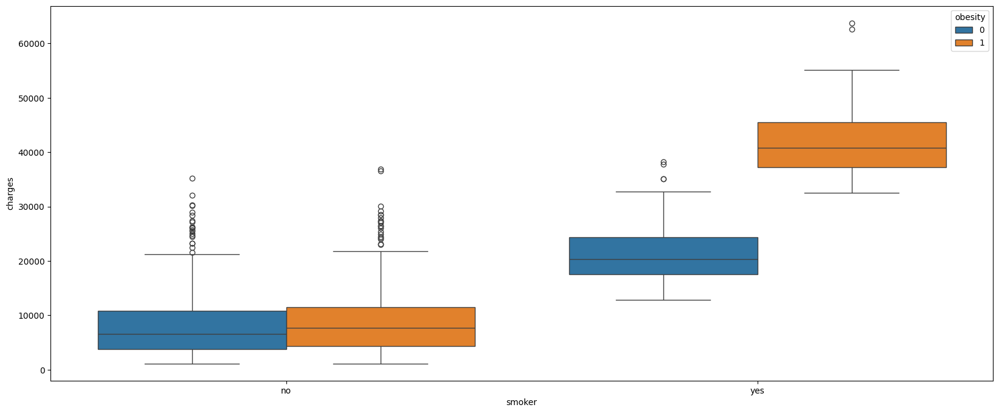

In [56]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["smoker"], hue=train["obesity"])
plt.show()

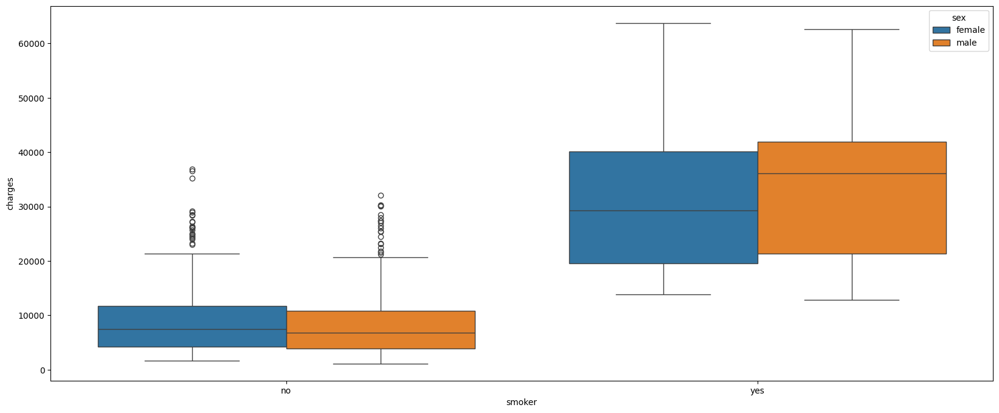

In [57]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["smoker"], hue=train["sex"])
plt.show()

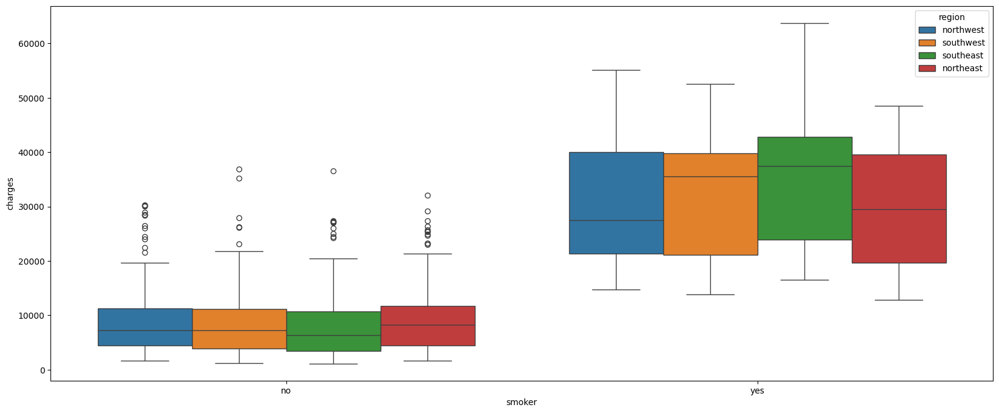

In [58]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["smoker"], hue=train["region"])
plt.show()

In [59]:
x_train["smoker"] = x_train["smoker"].apply(lambda x: 1 if x == "yes" else 0)
x_test["smoker"] = x_test["smoker"].apply(lambda x: 1 if x == "yes" else 0)

## region

In [60]:
train["region"].isnull().sum(), test["region"].isnull().sum()

(np.int64(0), np.int64(0))

In [61]:
train["region"].value_counts()

region
southeast    282
southwest    265
northeast    263
northwest    259
Name: count, dtype: int64

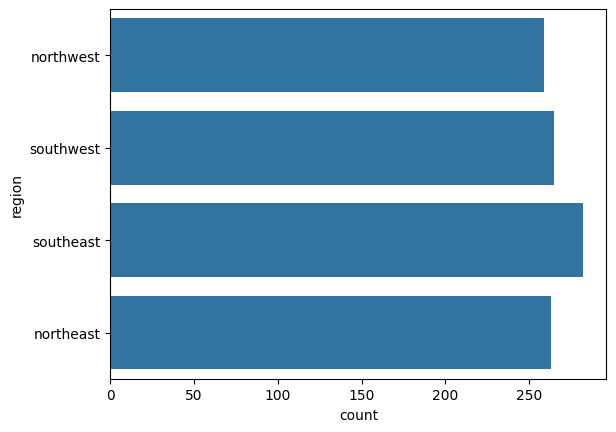

In [62]:
sns.countplot(train["region"])
plt.show()

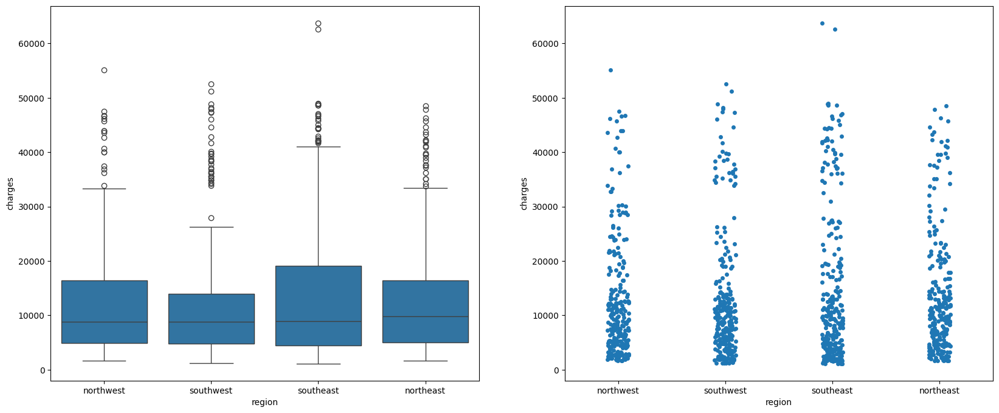

In [63]:
fig = plt.figure(figsize=(20,8))
gs = GridSpec(1,2)
sns.boxplot(y=train.charges, x=train["region"], ax=fig.add_subplot(gs[0,0]))
sns.stripplot(y=train.charges, x=train["region"], ax=fig.add_subplot(gs[0,1]))
plt.show()

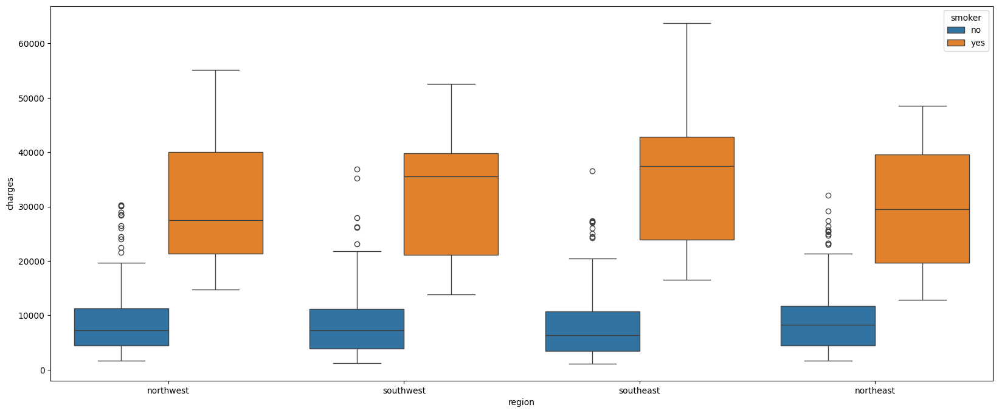

In [64]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["region"], hue=train["smoker"])
plt.show()

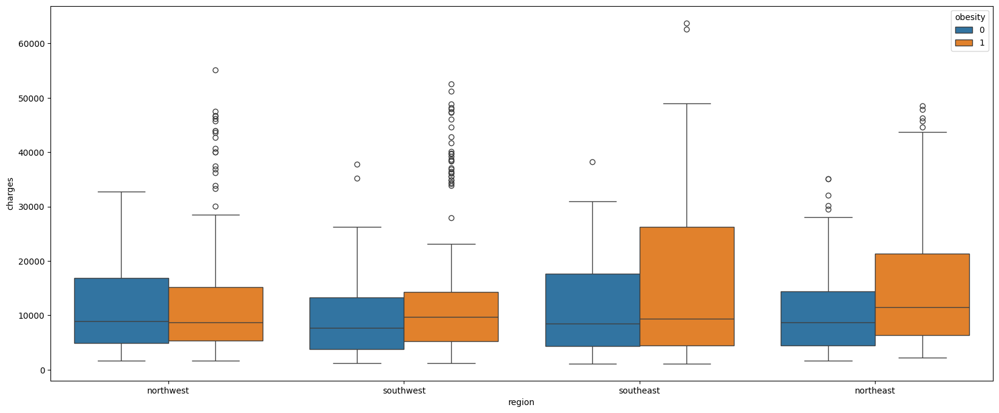

In [65]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["region"], hue=train["obesity"])
plt.show()

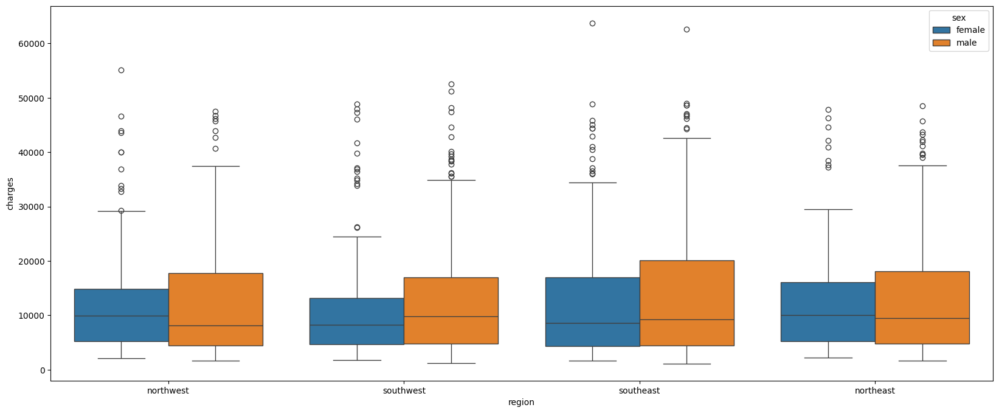

In [66]:
fig = plt.figure(figsize=(20,8))
sns.boxplot(y=train.charges, x=train["region"], hue=train["sex"])
plt.show()

In [67]:
x_train["northeast"] = x_train["region"].apply(lambda x: 1 if x == "northeast" else 0)
x_train["northwest"] = x_train["region"].apply(lambda x: 1 if x == "northwest" else 0)
x_train["southeast"] = x_train["region"].apply(lambda x: 1 if x == "southeast" else 0)
x_train["southwest"] = x_train["region"].apply(lambda x: 1 if x == "southwest" else 0)

x_train.drop(columns=["region"], inplace=True)

In [68]:
x_test["northeast"] = x_test["region"].apply(lambda x: 1 if x == "northeast" else 0)
x_test["northwest"] = x_test["region"].apply(lambda x: 1 if x == "northwest" else 0)
x_test["southeast"] = x_test["region"].apply(lambda x: 1 if x == "southeast" else 0)
x_test["southwest"] = x_test["region"].apply(lambda x: 1 if x == "southwest" else 0)

x_test.drop(columns=["region"], inplace=True)

In [69]:
x_train

,age,sex,bmi,children,smoker,obesity,northeast,northwest,southeast,southwest
216,53,0,7.667784,0,0,0,0,1,0,0
731,53,1,6.781023,1,0,0,0,0,0,1
866,18,1,9.237548,0,0,1,0,0,1,0
202,60,0,7.243067,0,0,0,0,1,0,0
820,45,1,8.740938,1,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
715,60,1,8.030508,0,0,0,0,0,0,1
905,26,0,8.100425,2,0,0,1,0,0,0
1096,51,0,8.918320,2,1,1,1,0,0,0
235,40,0,6.927870,2,1,0,0,0,1,0


# Correlação de Variáveis

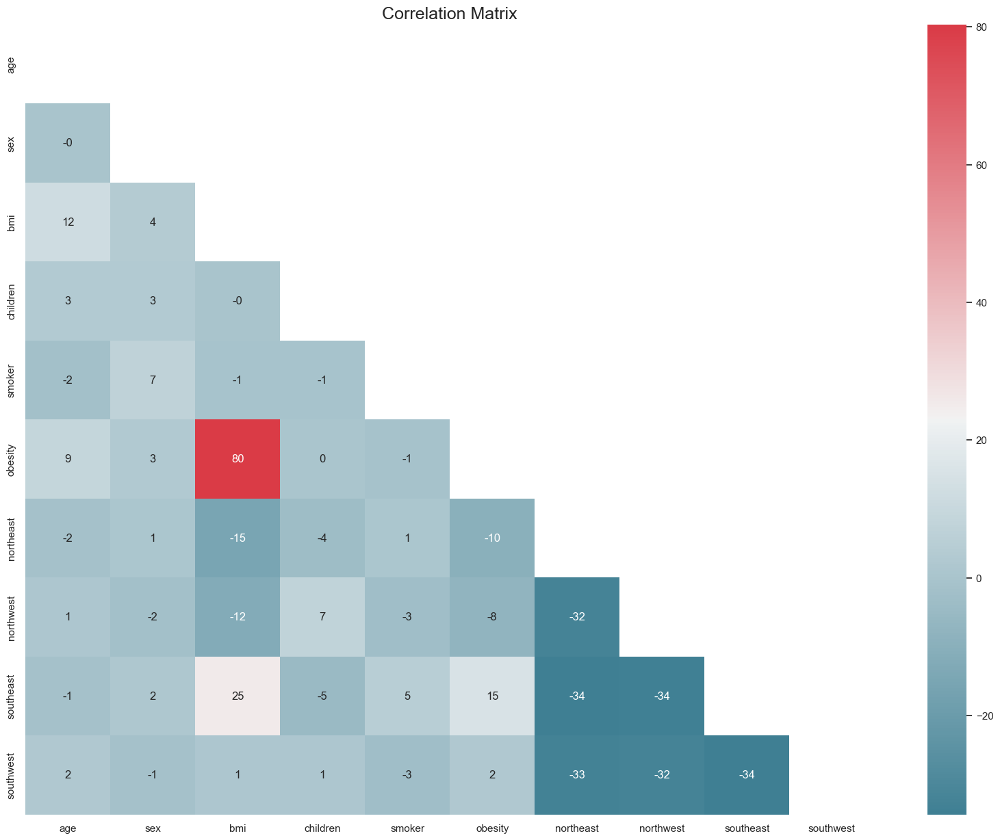

In [70]:
sns.set(style="white")

corr = 100*x_train.corr()

mask = np.triu(np.ones_like(corr, dtype=np.bool_))

f, ax = plt.subplots(figsize=(20, 15))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

plt.title('Correlation Matrix', fontsize=18)

sns.heatmap(corr, mask=mask, cmap=cmap, annot=True, fmt=".0f")

plt.show()

In [71]:
x_train.drop(columns=["obesity"], inplace=True)
x_test.drop(columns=["obesity"], inplace=True)

# Machine Learning

## Transformação das Variáveis

### Variáveis Preditoras

In [72]:
scaler = MinMaxScaler()
scaler.fit(x_train)
x_train_transformed = scaler.transform(x_train)

In [73]:
x_test_transformed = scaler.transform(x_test)

### Variável Target

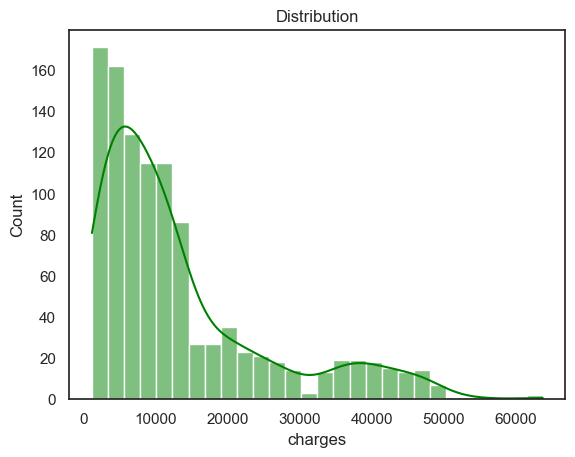

In [74]:
sns.histplot(train["charges"], color = 'green', kde=True)
plt.title('Distribution')
plt.show()

In [75]:
wrapped_model = TransformedTargetRegressor(regressor=RandomForestRegressor(), transformer=MinMaxScaler())

## Feature Importance

In [76]:
wrapped_model.fit(x_train_transformed, y_train)

TransformedTargetRegressor(regressor=RandomForestRegressor(),
                           transformer=MinMaxScaler())

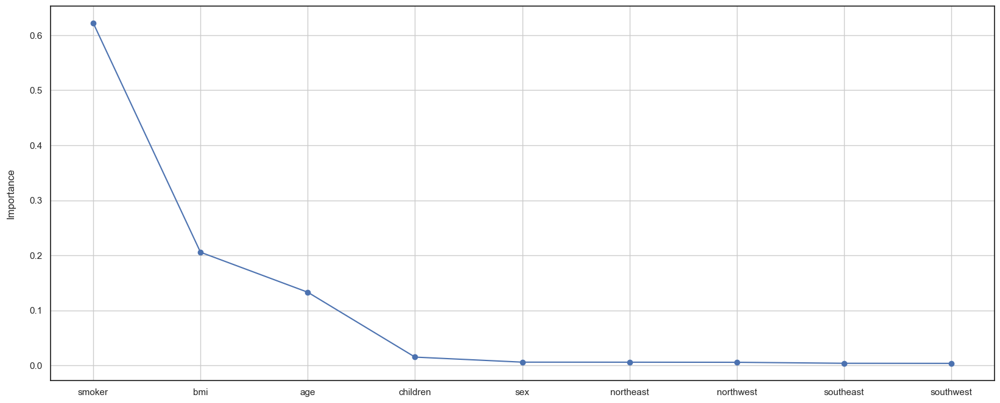

In [77]:
feature_importances = pd.DataFrame(wrapped_model.regressor_.feature_importances_,
                                   index = x_train.columns,
                                   columns=['importance']).sort_values('importance',ascending=False)

plt.figure(figsize=(20,8))
plt.plot(feature_importances)
plt.scatter(y=feature_importances.importance,x=feature_importances.index)
plt.ylabel('Importance\n')
plt.grid()
plt.show()

## Regressão Linear

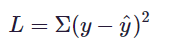

In [78]:
Image("linear.png")

In [79]:
wrapped_model = TransformedTargetRegressor(regressor=LinearRegression(), transformer=MinMaxScaler())

In [80]:
wrapped_model.fit(x_train_transformed, y_train)

TransformedTargetRegressor(regressor=LinearRegression(),
                           transformer=MinMaxScaler())

In [81]:
y_predicted = np.concatenate(wrapped_model.predict(x_test_transformed), axis=0)

In [82]:
metrics = pd.DataFrame({'Predicted': y_predicted, 'Real': y_test["charges"]})

In [83]:
metrics

,Predicted,Real
559,4415.237194,1646.42970
1087,12938.851008,11353.22760
1020,12623.348652,8798.59300
460,13378.770096,10381.47870
802,478.732726,2103.08000
...,...,...
682,33726.774757,40103.89000
629,35874.527126,42983.45850
893,36694.982991,44202.65360
807,4950.416150,2136.88225


In [84]:
mean_squared_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(35403045.312391)

In [85]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.7628423524654939

In [ ]:
0.7631593119861503

In [86]:
mean_absolute_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(4091.184699304579)

## Lasso

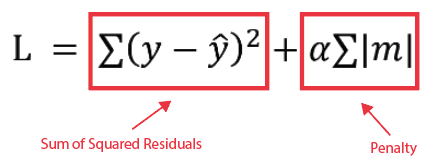

In [87]:
Image("lasso.png")

In [88]:
wrapped_model = TransformedTargetRegressor(regressor=Lasso(alpha=0.01), transformer=MinMaxScaler())

In [89]:
wrapped_model.fit(x_train_transformed, y_train)

TransformedTargetRegressor(regressor=Lasso(alpha=0.01),
                           transformer=MinMaxScaler())

In [90]:
y_predicted = np.concatenate(wrapped_model.predict(x_test_transformed), axis=0)

In [91]:
metrics = pd.DataFrame({'Predicted': y_predicted, 'Real': y_test["charges"]})

In [92]:
metrics

,Predicted,Real
559,6661.860790,1646.42970
1087,11408.995232,11353.22760
1020,10659.447688,8798.59300
460,10409.598507,10381.47870
802,6911.709971,2103.08000
...,...,...
682,28984.380332,40103.89000
629,29609.003285,42983.45850
893,29983.777057,44202.65360
807,6661.860790,2136.88225


In [93]:
mean_squared_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(49399099.10422782)

In [94]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.6690856950155573

In [95]:
mean_absolute_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(4980.101492685139)

## KernelRidge

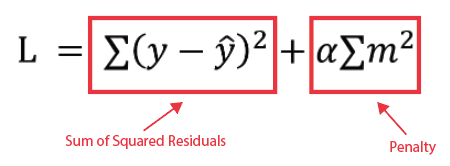

In [97]:
Image("ridge.png")

In [98]:
wrapped_model = TransformedTargetRegressor(regressor=KernelRidge(alpha=1), transformer=MinMaxScaler())

In [99]:
wrapped_model.fit(x_train_transformed, y_train)

TransformedTargetRegressor(regressor=KernelRidge(), transformer=MinMaxScaler())

In [100]:
y_predicted = np.concatenate(wrapped_model.predict(x_test_transformed), axis=0)

In [101]:
metrics = pd.DataFrame({'Predicted': y_predicted, 'Real': y_test["charges"]})

In [102]:
metrics

,Predicted,Real
559,4427.083949,1646.42970
1087,12893.900125,11353.22760
1020,12536.271893,8798.59300
460,13320.313783,10381.47870
802,724.825335,2103.08000
...,...,...
682,33520.232376,40103.89000
629,35607.771190,42983.45850
893,36453.152029,44202.65360
807,4956.120589,2136.88225


In [103]:
mean_squared_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(35553846.822972625)

In [104]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.7618321644667323

In [105]:
mean_absolute_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(4084.4754379998317)

## ElasticNet

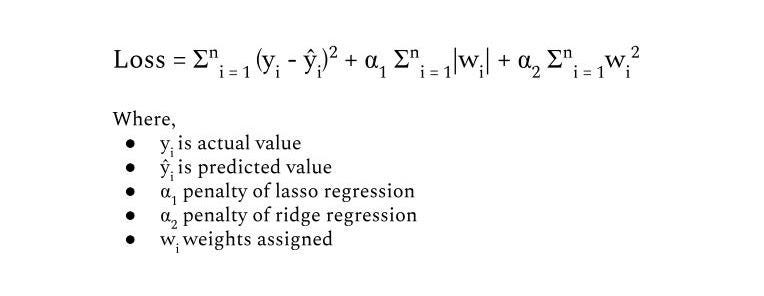

In [106]:
Image("elastic.jpg")

In [107]:
wrapped_model = TransformedTargetRegressor(regressor=ElasticNet(alpha=0.001, l1_ratio=0.1), transformer=MinMaxScaler())

In [108]:
wrapped_model.fit(x_train_transformed, y_train)

TransformedTargetRegressor(regressor=ElasticNet(alpha=0.001, l1_ratio=0.1),
                           transformer=MinMaxScaler())

In [109]:
y_predicted = np.concatenate(wrapped_model.predict(x_test_transformed), axis=0)

In [110]:
metrics = pd.DataFrame({'Predicted': y_predicted, 'Real': y_test["charges"]})

In [111]:
metrics

,Predicted,Real
559,4416.523868,1646.42970
1087,12890.036243,11353.22760
1020,12578.166095,8798.59300
460,13298.353426,10381.47870
802,773.088687,2103.08000
...,...,...
682,33532.056983,40103.89000
629,35520.739498,42983.45850
893,36464.184619,44202.65360
807,4891.178642,2136.88225


In [112]:
mean_squared_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(35554307.46182953)

In [113]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.761829078742702

In [ ]:
mean_absolute_error(y_true=y_test["charges"], y_pred=y_predicted)

# Otimização de Hiper Parâmetros

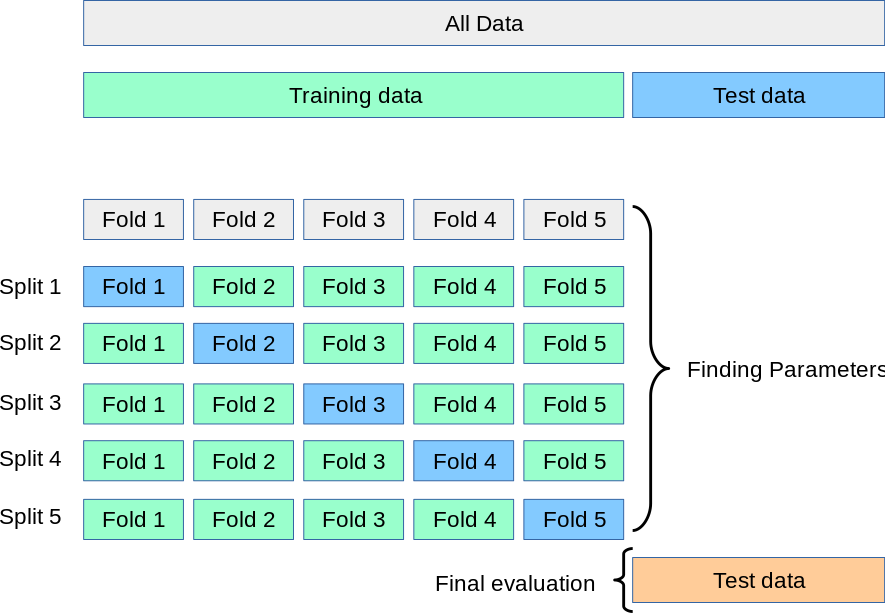

In [114]:
Image("cross validation.png")

## Regressão Linear

In [115]:
wrapped_model = TransformedTargetRegressor(regressor=LinearRegression(), transformer=MinMaxScaler())

param_grid = {'fit_intercept': [True, False], 
              'positive': [True, False]}

r = GridSearchCV(wrapped_model.regressor,
                 param_grid = param_grid, 
                 cv = 4, 
                 scoring = "r2",
                 verbose = 10)

r.fit(x_train_transformed, y_train)

r_best = r.best_estimator_

r.best_score_

Fitting 4 folds for each of 4 candidates, totalling 16 fits
[CV 1/4; 1/4] START fit_intercept=True, positive=True...........................
[CV 1/4; 1/4] END fit_intercept=True, positive=True;, score=0.713 total time=   0.0s
[CV 2/4; 1/4] START fit_intercept=True, positive=True...........................
[CV 2/4; 1/4] END fit_intercept=True, positive=True;, score=0.742 total time=   0.0s
[CV 3/4; 1/4] START fit_intercept=True, positive=True...........................
[CV 3/4; 1/4] END fit_intercept=True, positive=True;, score=0.749 total time=   0.0s
[CV 4/4; 1/4] START fit_intercept=True, positive=True...........................
[CV 4/4; 1/4] END fit_intercept=True, positive=True;, score=0.766 total time=   0.0s
[CV 1/4; 2/4] START fit_intercept=True, positive=False..........................
[CV 1/4; 2/4] END fit_intercept=True, positive=False;, score=0.708 total time=   0.0s
[CV 2/4; 2/4] START fit_intercept=True, positive=False..........................
[CV 2/4; 2/4] END fit_interc

np.float64(0.7423164044272773)

In [116]:
y_predicted = np.concatenate(r_best.predict(x_test_transformed), axis=0)

In [117]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.7631593119861503

In [118]:
r_best.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': True}

## Lasso

In [119]:
wrapped_model = TransformedTargetRegressor(regressor=Lasso(), transformer=MinMaxScaler())

param_grid = {'fit_intercept': [True, False], 
              'positive': [True, False], 
              'alpha': [0.01, 0.03, 0.05, 0.07, 0.1], 
              'max_iter': [800, 1000, 1200, 1500], 
              'warm_start': [True, False], 
              'selection': ['cyclic', 'random'], 
              'tol': [0.0001, 0.0005, 0.0008, 0.001]}

l = GridSearchCV(wrapped_model.regressor,
                 param_grid = param_grid, 
                 cv = 4, 
                 scoring = "r2",
                 verbose = 10)

l.fit(x_train_transformed, y_train)

l_best = l.best_estimator_

l.best_score_

Fitting 4 folds for each of 1280 candidates, totalling 5120 fits
[CV 1/4; 1/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=True, selection=cyclic, tol=0.0001, warm_start=True
[CV 1/4; 1/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=True, selection=cyclic, tol=0.0001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=True, selection=cyclic, tol=0.0001, warm_start=True
[CV 2/4; 1/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=True, selection=cyclic, tol=0.0001, warm_start=True;, score=0.742 total time=   0.0s
[CV 3/4; 1/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=True, selection=cyclic, tol=0.0001, warm_start=True
[CV 3/4; 1/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=True, selection=cyclic, tol=0.0001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1/1280] START alpha=0.01, fit_intercept=True, max_ite

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 17/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 18/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 1/4; 18/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 18/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 2/4; 18/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 18/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 3/4; 18/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.00

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 22/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 22/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 4/4; 22/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 23/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 23/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 23/1280] START alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 2/4; 23/1280] END alpha=0.01, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, wa

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 53/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 53/1280] START alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 53/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 54/1280] START alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 54/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 54/1280] START alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 54/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 62/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 62/1280] START alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 62/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 63/1280] START alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True
[CV 1/4; 63/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 63/1280] START alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True
[CV 2/4; 63/1280] END alpha=0.01, fit_intercept=True, max_iter=1000, positive=False, selection=random, tol=0.

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 84/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 85/1280] START alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 85/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 85/1280] START alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 2/4; 85/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 85/1280] START alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 85/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 92/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 92/1280] START alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 92/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 92/1280] START alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 4/4; 92/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 93/1280] START alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 1/4; 93/1280] END alpha=0.01, fit_intercept=True, max_iter=1200, positive=False, selection=random, t

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 115/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 116/1280] START alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 116/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 116/1280] START alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 116/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 116/1280] START alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 116/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cy

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.683e+08, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 120/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 120/1280] START alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 4/4; 120/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 121/1280] START alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=random, tol=0.0001, warm_start=True
[CV 1/4; 121/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=random, tol=0.0001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 121/1280] START alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=random, tol=0.0001, warm_start=True
[CV 2/4; 121/1280] END alpha=0.01, fit_intercept=True, max_iter=1500, positive=False, selection=random,

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 277/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 278/1280] START alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 278/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 278/1280] START alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 278/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 278/1280] START alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 3/4; 278/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, t

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(


[CV 3/4; 285/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 285/1280] START alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 4/4; 285/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 286/1280] START alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 1/4; 286/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 286/1280] START alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 2/4; 286/1280] END alpha=0.03, fit_intercept=True, max_iter=800, positive=False, selection=random, tol

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 305/1280] END alpha=0.03, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 306/1280] START alpha=0.03, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 1/4; 306/1280] END alpha=0.03, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 306/1280] START alpha=0.03, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 2/4; 306/1280] END alpha=0.03, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 306/1280] START alpha=0.03, fit_intercept=True, max_iter=1000, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 3/4; 306/1280] END alpha=0.03, fit_intercept=True, max_iter=1000, positive=False, selection=cy

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 340/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 340/1280] START alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 340/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 340/1280] START alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 340/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 341/1280] START alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 341/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=cy

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.685e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(


[CV 4/4; 346/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 347/1280] START alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 1/4; 347/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 347/1280] START alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 2/4; 347/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 347/1280] START alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 3/4; 347/1280] END alpha=0.03, fit_intercept=True, max_iter=1200, positive=False, selection=random

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.687e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.687e+08, tolerance: 1.175e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 529/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 530/1280] START alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 1/4; 530/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 530/1280] START alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 2/4; 530/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 530/1280] START alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.0001, warm_start=False
[CV 3/4; 530/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, t

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.687e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.687e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(


[CV 3/4; 535/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 535/1280] START alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 535/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 536/1280] START alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 536/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 536/1280] START alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 536/1280] END alpha=0.05, fit_intercept=True, max_iter=800, positive=False, selection=cyclic, tol=0.001

np.float64(0.7423231036078862)

In [123]:
y_predicted = l_best.predict(x_test_transformed)

In [124]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.7631537979307506

In [125]:
l_best.get_params()

{'alpha': 0.1,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': 1500,
 'positive': True,
 'precompute': False,
 'random_state': None,
 'selection': 'random',
 'tol': 0.001,
 'warm_start': False}

## Ridge

In [126]:
wrapped_model = TransformedTargetRegressor(regressor=KernelRidge(), transformer=MinMaxScaler())

param_grid = {'kernel': ['additive_chi2', 'chi2', 'linear', 'poly', 'polynomial', 'rbf', 'laplacian', 'sigmoid', 'cosine'], 
              'alpha': [0.8, 1, 1.2], 
              'degree':[3,5,7],
              'coef0':[0,2,4]}

kr = GridSearchCV(wrapped_model.regressor,
                 param_grid = param_grid, 
                 cv = 4, 
                 scoring = "r2",
                 verbose = 10)

kr.fit(x_train_transformed, y_train)

kr_best = kr.best_estimator_

kr.best_score_

Fitting 4 folds for each of 243 candidates, totalling 972 fits
[CV 1/4; 1/243] START alpha=0.8, coef0=0, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 1/243] END alpha=0.8, coef0=0, degree=3, kernel=additive_chi2;, score=0.716 total time=   2.4s
[CV 2/4; 1/243] START alpha=0.8, coef0=0, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 1/243] END alpha=0.8, coef0=0, degree=3, kernel=additive_chi2;, score=0.739 total time=   2.3s
[CV 3/4; 1/243] START alpha=0.8, coef0=0, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 1/243] END alpha=0.8, coef0=0, degree=3, kernel=additive_chi2;, score=0.750 total time=   1.2s
[CV 4/4; 1/243] START alpha=0.8, coef0=0, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 1/243] END alpha=0.8, coef0=0, degree=3, kernel=additive_chi2;, score=0.771 total time=   2.4s
[CV 1/4; 2/243] START alpha=0.8, coef0=0, degree=3, kernel=chi2.................
[CV 1/4; 2/243] END alpha=0.8, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 2/243] START alpha=0.8, coef0=0, degree=3, kernel=chi2.................
[CV 2/4; 2/243] END alpha=0.8, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 2/243] START alpha=0.8, coef0=0, degree=3, kernel=chi2.................
[CV 3/4; 2/243] END alpha=0.8, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 2/243] START alpha=0.8, coef0=0, degree=3, kernel=chi2.................
[CV 4/4; 2/243] END alpha=0.8, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 3/243] START alpha=0.8, coef0=0, degree=3, kernel=linear...............
[CV 1/4; 3/243] END alpha=0.8, coef0=0, degree=3, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 3/243] START 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 10/243] END alpha=0.8, coef0=0, degree=5, kernel=additive_chi2;, score=0.716 total time=   1.6s
[CV 2/4; 10/243] START alpha=0.8, coef0=0, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 10/243] END alpha=0.8, coef0=0, degree=5, kernel=additive_chi2;, score=0.739 total time=   2.5s
[CV 3/4; 10/243] START alpha=0.8, coef0=0, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 10/243] END alpha=0.8, coef0=0, degree=5, kernel=additive_chi2;, score=0.750 total time=   2.5s
[CV 4/4; 10/243] START alpha=0.8, coef0=0, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 10/243] END alpha=0.8, coef0=0, degree=5, kernel=additive_chi2;, score=0.771 total time=   3.3s
[CV 1/4; 11/243] START alpha=0.8, coef0=0, degree=5, kernel=chi2................
[CV 1/4; 11/243] END alpha=0.8, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 11/243] START alpha=0.8, coef0=0, degree=5, kernel=chi2................
[CV 2/4; 11/243] END alpha=0.8, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 11/243] START alpha=0.8, coef0=0, degree=5, kernel=chi2................
[CV 3/4; 11/243] END alpha=0.8, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 11/243] START alpha=0.8, coef0=0, degree=5, kernel=chi2................
[CV 4/4; 11/243] END alpha=0.8, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 12/243] START alpha=0.8, coef0=0, degree=5, kernel=linear..............
[CV 1/4; 12/243] END alpha=0.8, coef0=0, degree=5, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 12/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 19/243] END alpha=0.8, coef0=0, degree=7, kernel=additive_chi2;, score=0.716 total time=   1.1s
[CV 2/4; 19/243] START alpha=0.8, coef0=0, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 19/243] END alpha=0.8, coef0=0, degree=7, kernel=additive_chi2;, score=0.739 total time=   2.7s
[CV 3/4; 19/243] START alpha=0.8, coef0=0, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 19/243] END alpha=0.8, coef0=0, degree=7, kernel=additive_chi2;, score=0.750 total time=   2.0s
[CV 4/4; 19/243] START alpha=0.8, coef0=0, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 19/243] END alpha=0.8, coef0=0, degree=7, kernel=additive_chi2;, score=0.771 total time=   2.7s
[CV 1/4; 20/243] START alpha=0.8, coef0=0, degree=7, kernel=chi2................
[CV 1/4; 20/243] END alpha=0.8, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 20/243] START alpha=0.8, coef0=0, degree=7, kernel=chi2................
[CV 2/4; 20/243] END alpha=0.8, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 20/243] START alpha=0.8, coef0=0, degree=7, kernel=chi2................
[CV 3/4; 20/243] END alpha=0.8, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 20/243] START alpha=0.8, coef0=0, degree=7, kernel=chi2................
[CV 4/4; 20/243] END alpha=0.8, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 21/243] START alpha=0.8, coef0=0, degree=7, kernel=linear..............
[CV 1/4; 21/243] END alpha=0.8, coef0=0, degree=7, kernel=linear;, score=0.713 total time=   0.1s
[CV 2/4; 21/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 28/243] END alpha=0.8, coef0=2, degree=3, kernel=additive_chi2;, score=0.716 total time=   2.0s
[CV 2/4; 28/243] START alpha=0.8, coef0=2, degree=3, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 28/243] END alpha=0.8, coef0=2, degree=3, kernel=additive_chi2;, score=0.739 total time=   1.0s
[CV 3/4; 28/243] START alpha=0.8, coef0=2, degree=3, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 28/243] END alpha=0.8, coef0=2, degree=3, kernel=additive_chi2;, score=0.750 total time=   1.2s
[CV 4/4; 28/243] START alpha=0.8, coef0=2, degree=3, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 28/243] END alpha=0.8, coef0=2, degree=3, kernel=additive_chi2;, score=0.771 total time=   1.7s
[CV 1/4; 29/243] START alpha=0.8, coef0=2, degree=3, kernel=chi2................
[CV 1/4; 29/243] END alpha=0.8, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 29/243] START alpha=0.8, coef0=2, degree=3, kernel=chi2................
[CV 2/4; 29/243] END alpha=0.8, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 29/243] START alpha=0.8, coef0=2, degree=3, kernel=chi2................
[CV 3/4; 29/243] END alpha=0.8, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 29/243] START alpha=0.8, coef0=2, degree=3, kernel=chi2................
[CV 4/4; 29/243] END alpha=0.8, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 30/243] START alpha=0.8, coef0=2, degree=3, kernel=linear..............
[CV 1/4; 30/243] END alpha=0.8, coef0=2, degree=3, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 30/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 37/243] END alpha=0.8, coef0=2, degree=5, kernel=additive_chi2;, score=0.716 total time=   1.8s
[CV 2/4; 37/243] START alpha=0.8, coef0=2, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 37/243] END alpha=0.8, coef0=2, degree=5, kernel=additive_chi2;, score=0.739 total time=   2.5s
[CV 3/4; 37/243] START alpha=0.8, coef0=2, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 37/243] END alpha=0.8, coef0=2, degree=5, kernel=additive_chi2;, score=0.750 total time=   1.9s
[CV 4/4; 37/243] START alpha=0.8, coef0=2, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 37/243] END alpha=0.8, coef0=2, degree=5, kernel=additive_chi2;, score=0.771 total time=   1.9s
[CV 1/4; 38/243] START alpha=0.8, coef0=2, degree=5, kernel=chi2................
[CV 1/4; 38/243] END alpha=0.8, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 38/243] START alpha=0.8, coef0=2, degree=5, kernel=chi2................
[CV 2/4; 38/243] END alpha=0.8, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 38/243] START alpha=0.8, coef0=2, degree=5, kernel=chi2................
[CV 3/4; 38/243] END alpha=0.8, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 38/243] START alpha=0.8, coef0=2, degree=5, kernel=chi2................
[CV 4/4; 38/243] END alpha=0.8, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 39/243] START alpha=0.8, coef0=2, degree=5, kernel=linear..............
[CV 1/4; 39/243] END alpha=0.8, coef0=2, degree=5, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 39/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 46/243] END alpha=0.8, coef0=2, degree=7, kernel=additive_chi2;, score=0.716 total time=   1.7s
[CV 2/4; 46/243] START alpha=0.8, coef0=2, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 46/243] END alpha=0.8, coef0=2, degree=7, kernel=additive_chi2;, score=0.739 total time=   1.8s
[CV 3/4; 46/243] START alpha=0.8, coef0=2, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 46/243] END alpha=0.8, coef0=2, degree=7, kernel=additive_chi2;, score=0.750 total time=   1.4s
[CV 4/4; 46/243] START alpha=0.8, coef0=2, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 46/243] END alpha=0.8, coef0=2, degree=7, kernel=additive_chi2;, score=0.771 total time=   1.7s
[CV 1/4; 47/243] START alpha=0.8, coef0=2, degree=7, kernel=chi2................
[CV 1/4; 47/243] END alpha=0.8, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 47/243] START alpha=0.8, coef0=2, degree=7, kernel=chi2................
[CV 2/4; 47/243] END alpha=0.8, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 47/243] START alpha=0.8, coef0=2, degree=7, kernel=chi2................
[CV 3/4; 47/243] END alpha=0.8, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 47/243] START alpha=0.8, coef0=2, degree=7, kernel=chi2................
[CV 4/4; 47/243] END alpha=0.8, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 48/243] START alpha=0.8, coef0=2, degree=7, kernel=linear..............
[CV 1/4; 48/243] END alpha=0.8, coef0=2, degree=7, kernel=linear;, score=0.713 total time=   0.2s
[CV 2/4; 48/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 55/243] END alpha=0.8, coef0=4, degree=3, kernel=additive_chi2;, score=0.716 total time=   1.2s
[CV 2/4; 55/243] START alpha=0.8, coef0=4, degree=3, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 55/243] END alpha=0.8, coef0=4, degree=3, kernel=additive_chi2;, score=0.739 total time=   2.3s
[CV 3/4; 55/243] START alpha=0.8, coef0=4, degree=3, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 55/243] END alpha=0.8, coef0=4, degree=3, kernel=additive_chi2;, score=0.750 total time=   2.5s
[CV 4/4; 55/243] START alpha=0.8, coef0=4, degree=3, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 55/243] END alpha=0.8, coef0=4, degree=3, kernel=additive_chi2;, score=0.771 total time=   1.8s
[CV 1/4; 56/243] START alpha=0.8, coef0=4, degree=3, kernel=chi2................
[CV 1/4; 56/243] END alpha=0.8, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 56/243] START alpha=0.8, coef0=4, degree=3, kernel=chi2................
[CV 2/4; 56/243] END alpha=0.8, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 56/243] START alpha=0.8, coef0=4, degree=3, kernel=chi2................
[CV 3/4; 56/243] END alpha=0.8, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 56/243] START alpha=0.8, coef0=4, degree=3, kernel=chi2................
[CV 4/4; 56/243] END alpha=0.8, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 57/243] START alpha=0.8, coef0=4, degree=3, kernel=linear..............
[CV 1/4; 57/243] END alpha=0.8, coef0=4, degree=3, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 57/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 64/243] END alpha=0.8, coef0=4, degree=5, kernel=additive_chi2;, score=0.716 total time=   2.3s
[CV 2/4; 64/243] START alpha=0.8, coef0=4, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 64/243] END alpha=0.8, coef0=4, degree=5, kernel=additive_chi2;, score=0.739 total time=   2.1s
[CV 3/4; 64/243] START alpha=0.8, coef0=4, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 64/243] END alpha=0.8, coef0=4, degree=5, kernel=additive_chi2;, score=0.750 total time=   2.0s
[CV 4/4; 64/243] START alpha=0.8, coef0=4, degree=5, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 64/243] END alpha=0.8, coef0=4, degree=5, kernel=additive_chi2;, score=0.771 total time=   2.5s
[CV 1/4; 65/243] START alpha=0.8, coef0=4, degree=5, kernel=chi2................
[CV 1/4; 65/243] END alpha=0.8, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 65/243] START alpha=0.8, coef0=4, degree=5, kernel=chi2................
[CV 2/4; 65/243] END alpha=0.8, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 65/243] START alpha=0.8, coef0=4, degree=5, kernel=chi2................
[CV 3/4; 65/243] END alpha=0.8, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 65/243] START alpha=0.8, coef0=4, degree=5, kernel=chi2................
[CV 4/4; 65/243] END alpha=0.8, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 66/243] START alpha=0.8, coef0=4, degree=5, kernel=linear..............
[CV 1/4; 66/243] END alpha=0.8, coef0=4, degree=5, kernel=linear;, score=0.713 total time=   0.3s
[CV 2/4; 66/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 73/243] END alpha=0.8, coef0=4, degree=7, kernel=additive_chi2;, score=0.716 total time=   2.4s
[CV 2/4; 73/243] START alpha=0.8, coef0=4, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 73/243] END alpha=0.8, coef0=4, degree=7, kernel=additive_chi2;, score=0.739 total time=   2.7s
[CV 3/4; 73/243] START alpha=0.8, coef0=4, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 73/243] END alpha=0.8, coef0=4, degree=7, kernel=additive_chi2;, score=0.750 total time=   2.6s
[CV 4/4; 73/243] START alpha=0.8, coef0=4, degree=7, kernel=additive_chi2.......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 73/243] END alpha=0.8, coef0=4, degree=7, kernel=additive_chi2;, score=0.771 total time=   2.0s
[CV 1/4; 74/243] START alpha=0.8, coef0=4, degree=7, kernel=chi2................
[CV 1/4; 74/243] END alpha=0.8, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 74/243] START alpha=0.8, coef0=4, degree=7, kernel=chi2................
[CV 2/4; 74/243] END alpha=0.8, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 74/243] START alpha=0.8, coef0=4, degree=7, kernel=chi2................
[CV 3/4; 74/243] END alpha=0.8, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 74/243] START alpha=0.8, coef0=4, degree=7, kernel=chi2................
[CV 4/4; 74/243] END alpha=0.8, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 75/243] START alpha=0.8, coef0=4, degree=7, kernel=linear..............
[CV 1/4; 75/243] END alpha=0.8, coef0=4, degree=7, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 75/243]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 82/243] END alpha=1, coef0=0, degree=3, kernel=additive_chi2;, score=0.716 total time=   2.0s
[CV 2/4; 82/243] START alpha=1, coef0=0, degree=3, kernel=additive_chi2.........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 82/243] END alpha=1, coef0=0, degree=3, kernel=additive_chi2;, score=0.739 total time=   2.2s
[CV 3/4; 82/243] START alpha=1, coef0=0, degree=3, kernel=additive_chi2.........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 82/243] END alpha=1, coef0=0, degree=3, kernel=additive_chi2;, score=0.750 total time=   1.8s
[CV 4/4; 82/243] START alpha=1, coef0=0, degree=3, kernel=additive_chi2.........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 82/243] END alpha=1, coef0=0, degree=3, kernel=additive_chi2;, score=0.771 total time=   1.6s
[CV 1/4; 83/243] START alpha=1, coef0=0, degree=3, kernel=chi2..................
[CV 1/4; 83/243] END alpha=1, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 83/243] START alpha=1, coef0=0, degree=3, kernel=chi2..................
[CV 2/4; 83/243] END alpha=1, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 83/243] START alpha=1, coef0=0, degree=3, kernel=chi2..................
[CV 3/4; 83/243] END alpha=1, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 83/243] START alpha=1, coef0=0, degree=3, kernel=chi2..................
[CV 4/4; 83/243] END alpha=1, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 84/243] START alpha=1, coef0=0, degree=3, kernel=linear................
[CV 1/4; 84/243] END alpha=1, coef0=0, degree=3, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 84/243] START alpha

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 91/243] END alpha=1, coef0=0, degree=5, kernel=additive_chi2;, score=0.716 total time=   1.4s
[CV 2/4; 91/243] START alpha=1, coef0=0, degree=5, kernel=additive_chi2.........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 91/243] END alpha=1, coef0=0, degree=5, kernel=additive_chi2;, score=0.739 total time=   1.4s
[CV 3/4; 91/243] START alpha=1, coef0=0, degree=5, kernel=additive_chi2.........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 91/243] END alpha=1, coef0=0, degree=5, kernel=additive_chi2;, score=0.750 total time=   1.7s
[CV 4/4; 91/243] START alpha=1, coef0=0, degree=5, kernel=additive_chi2.........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 91/243] END alpha=1, coef0=0, degree=5, kernel=additive_chi2;, score=0.771 total time=   2.0s
[CV 1/4; 92/243] START alpha=1, coef0=0, degree=5, kernel=chi2..................
[CV 1/4; 92/243] END alpha=1, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 92/243] START alpha=1, coef0=0, degree=5, kernel=chi2..................
[CV 2/4; 92/243] END alpha=1, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 92/243] START alpha=1, coef0=0, degree=5, kernel=chi2..................
[CV 3/4; 92/243] END alpha=1, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 92/243] START alpha=1, coef0=0, degree=5, kernel=chi2..................
[CV 4/4; 92/243] END alpha=1, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 93/243] START alpha=1, coef0=0, degree=5, kernel=linear................
[CV 1/4; 93/243] END alpha=1, coef0=0, degree=5, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 93/243] START alpha

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 100/243] END alpha=1, coef0=0, degree=7, kernel=additive_chi2;, score=0.716 total time=   1.9s
[CV 2/4; 100/243] START alpha=1, coef0=0, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 100/243] END alpha=1, coef0=0, degree=7, kernel=additive_chi2;, score=0.739 total time=   2.0s
[CV 3/4; 100/243] START alpha=1, coef0=0, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 100/243] END alpha=1, coef0=0, degree=7, kernel=additive_chi2;, score=0.750 total time=   2.3s
[CV 4/4; 100/243] START alpha=1, coef0=0, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 100/243] END alpha=1, coef0=0, degree=7, kernel=additive_chi2;, score=0.771 total time=   2.0s
[CV 1/4; 101/243] START alpha=1, coef0=0, degree=7, kernel=chi2.................
[CV 1/4; 101/243] END alpha=1, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 101/243] START alpha=1, coef0=0, degree=7, kernel=chi2.................
[CV 2/4; 101/243] END alpha=1, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 101/243] START alpha=1, coef0=0, degree=7, kernel=chi2.................
[CV 3/4; 101/243] END alpha=1, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 101/243] START alpha=1, coef0=0, degree=7, kernel=chi2.................
[CV 4/4; 101/243] END alpha=1, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 102/243] START alpha=1, coef0=0, degree=7, kernel=linear...............
[CV 1/4; 102/243] END alpha=1, coef0=0, degree=7, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 102/243] STAR

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 109/243] END alpha=1, coef0=2, degree=3, kernel=additive_chi2;, score=0.716 total time=   1.9s
[CV 2/4; 109/243] START alpha=1, coef0=2, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 109/243] END alpha=1, coef0=2, degree=3, kernel=additive_chi2;, score=0.739 total time=   1.2s
[CV 3/4; 109/243] START alpha=1, coef0=2, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 109/243] END alpha=1, coef0=2, degree=3, kernel=additive_chi2;, score=0.750 total time=   2.5s
[CV 4/4; 109/243] START alpha=1, coef0=2, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 109/243] END alpha=1, coef0=2, degree=3, kernel=additive_chi2;, score=0.771 total time=   2.8s
[CV 1/4; 110/243] START alpha=1, coef0=2, degree=3, kernel=chi2.................
[CV 1/4; 110/243] END alpha=1, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 110/243] START alpha=1, coef0=2, degree=3, kernel=chi2.................
[CV 2/4; 110/243] END alpha=1, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 110/243] START alpha=1, coef0=2, degree=3, kernel=chi2.................
[CV 3/4; 110/243] END alpha=1, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 110/243] START alpha=1, coef0=2, degree=3, kernel=chi2.................
[CV 4/4; 110/243] END alpha=1, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 111/243] START alpha=1, coef0=2, degree=3, kernel=linear...............
[CV 1/4; 111/243] END alpha=1, coef0=2, degree=3, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 111/243] STAR

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 118/243] END alpha=1, coef0=2, degree=5, kernel=additive_chi2;, score=0.716 total time=   1.8s
[CV 2/4; 118/243] START alpha=1, coef0=2, degree=5, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 118/243] END alpha=1, coef0=2, degree=5, kernel=additive_chi2;, score=0.739 total time=   1.7s
[CV 3/4; 118/243] START alpha=1, coef0=2, degree=5, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 118/243] END alpha=1, coef0=2, degree=5, kernel=additive_chi2;, score=0.750 total time=   1.5s
[CV 4/4; 118/243] START alpha=1, coef0=2, degree=5, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 118/243] END alpha=1, coef0=2, degree=5, kernel=additive_chi2;, score=0.771 total time=   0.9s
[CV 1/4; 119/243] START alpha=1, coef0=2, degree=5, kernel=chi2.................
[CV 1/4; 119/243] END alpha=1, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 119/243] START alpha=1, coef0=2, degree=5, kernel=chi2.................
[CV 2/4; 119/243] END alpha=1, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 119/243] START alpha=1, coef0=2, degree=5, kernel=chi2.................
[CV 3/4; 119/243] END alpha=1, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 119/243] START alpha=1, coef0=2, degree=5, kernel=chi2.................
[CV 4/4; 119/243] END alpha=1, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 120/243] START alpha=1, coef0=2, degree=5, kernel=linear...............
[CV 1/4; 120/243] END alpha=1, coef0=2, degree=5, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 120/243] STAR

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 127/243] END alpha=1, coef0=2, degree=7, kernel=additive_chi2;, score=0.716 total time=   2.2s
[CV 2/4; 127/243] START alpha=1, coef0=2, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 127/243] END alpha=1, coef0=2, degree=7, kernel=additive_chi2;, score=0.739 total time=   1.3s
[CV 3/4; 127/243] START alpha=1, coef0=2, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 127/243] END alpha=1, coef0=2, degree=7, kernel=additive_chi2;, score=0.750 total time=   2.1s
[CV 4/4; 127/243] START alpha=1, coef0=2, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 127/243] END alpha=1, coef0=2, degree=7, kernel=additive_chi2;, score=0.771 total time=   1.8s
[CV 1/4; 128/243] START alpha=1, coef0=2, degree=7, kernel=chi2.................
[CV 1/4; 128/243] END alpha=1, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 128/243] START alpha=1, coef0=2, degree=7, kernel=chi2.................
[CV 2/4; 128/243] END alpha=1, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 128/243] START alpha=1, coef0=2, degree=7, kernel=chi2.................
[CV 3/4; 128/243] END alpha=1, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 128/243] START alpha=1, coef0=2, degree=7, kernel=chi2.................
[CV 4/4; 128/243] END alpha=1, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 129/243] START alpha=1, coef0=2, degree=7, kernel=linear...............
[CV 1/4; 129/243] END alpha=1, coef0=2, degree=7, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 129/243] STAR

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 136/243] END alpha=1, coef0=4, degree=3, kernel=additive_chi2;, score=0.716 total time=   1.6s
[CV 2/4; 136/243] START alpha=1, coef0=4, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 136/243] END alpha=1, coef0=4, degree=3, kernel=additive_chi2;, score=0.739 total time=   2.4s
[CV 3/4; 136/243] START alpha=1, coef0=4, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 136/243] END alpha=1, coef0=4, degree=3, kernel=additive_chi2;, score=0.750 total time=   2.1s
[CV 4/4; 136/243] START alpha=1, coef0=4, degree=3, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 136/243] END alpha=1, coef0=4, degree=3, kernel=additive_chi2;, score=0.771 total time=   1.8s
[CV 1/4; 137/243] START alpha=1, coef0=4, degree=3, kernel=chi2.................
[CV 1/4; 137/243] END alpha=1, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 137/243] START alpha=1, coef0=4, degree=3, kernel=chi2.................
[CV 2/4; 137/243] END alpha=1, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 137/243] START alpha=1, coef0=4, degree=3, kernel=chi2.................
[CV 3/4; 137/243] END alpha=1, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 137/243] START alpha=1, coef0=4, degree=3, kernel=chi2.................
[CV 4/4; 137/243] END alpha=1, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 138/243] START alpha=1, coef0=4, degree=3, kernel=linear...............
[CV 1/4; 138/243] END alpha=1, coef0=4, degree=3, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 138/243] STAR

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 145/243] END alpha=1, coef0=4, degree=5, kernel=additive_chi2;, score=0.716 total time=   1.8s
[CV 2/4; 145/243] START alpha=1, coef0=4, degree=5, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 145/243] END alpha=1, coef0=4, degree=5, kernel=additive_chi2;, score=0.739 total time=   1.1s
[CV 3/4; 145/243] START alpha=1, coef0=4, degree=5, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 145/243] END alpha=1, coef0=4, degree=5, kernel=additive_chi2;, score=0.750 total time=   1.9s
[CV 4/4; 145/243] START alpha=1, coef0=4, degree=5, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 145/243] END alpha=1, coef0=4, degree=5, kernel=additive_chi2;, score=0.771 total time=   2.3s
[CV 1/4; 146/243] START alpha=1, coef0=4, degree=5, kernel=chi2.................
[CV 1/4; 146/243] END alpha=1, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 146/243] START alpha=1, coef0=4, degree=5, kernel=chi2.................
[CV 2/4; 146/243] END alpha=1, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 146/243] START alpha=1, coef0=4, degree=5, kernel=chi2.................
[CV 3/4; 146/243] END alpha=1, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 146/243] START alpha=1, coef0=4, degree=5, kernel=chi2.................
[CV 4/4; 146/243] END alpha=1, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 147/243] START alpha=1, coef0=4, degree=5, kernel=linear...............
[CV 1/4; 147/243] END alpha=1, coef0=4, degree=5, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 147/243] STAR

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 154/243] END alpha=1, coef0=4, degree=7, kernel=additive_chi2;, score=0.716 total time=   1.6s
[CV 2/4; 154/243] START alpha=1, coef0=4, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 154/243] END alpha=1, coef0=4, degree=7, kernel=additive_chi2;, score=0.739 total time=   1.8s
[CV 3/4; 154/243] START alpha=1, coef0=4, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 154/243] END alpha=1, coef0=4, degree=7, kernel=additive_chi2;, score=0.750 total time=   2.1s
[CV 4/4; 154/243] START alpha=1, coef0=4, degree=7, kernel=additive_chi2........


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 154/243] END alpha=1, coef0=4, degree=7, kernel=additive_chi2;, score=0.771 total time=   2.5s
[CV 1/4; 155/243] START alpha=1, coef0=4, degree=7, kernel=chi2.................
[CV 1/4; 155/243] END alpha=1, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 155/243] START alpha=1, coef0=4, degree=7, kernel=chi2.................
[CV 2/4; 155/243] END alpha=1, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 155/243] START alpha=1, coef0=4, degree=7, kernel=chi2.................
[CV 3/4; 155/243] END alpha=1, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 155/243] START alpha=1, coef0=4, degree=7, kernel=chi2.................
[CV 4/4; 155/243] END alpha=1, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 156/243] START alpha=1, coef0=4, degree=7, kernel=linear...............
[CV 1/4; 156/243] END alpha=1, coef0=4, degree=7, kernel=linear;, score=0.713 total time=   0.0s
[CV 2/4; 156/243] STAR

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 163/243] END alpha=1.2, coef0=0, degree=3, kernel=additive_chi2;, score=0.716 total time=   1.8s
[CV 2/4; 163/243] START alpha=1.2, coef0=0, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 163/243] END alpha=1.2, coef0=0, degree=3, kernel=additive_chi2;, score=0.739 total time=   0.7s
[CV 3/4; 163/243] START alpha=1.2, coef0=0, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 163/243] END alpha=1.2, coef0=0, degree=3, kernel=additive_chi2;, score=0.750 total time=   1.9s
[CV 4/4; 163/243] START alpha=1.2, coef0=0, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 163/243] END alpha=1.2, coef0=0, degree=3, kernel=additive_chi2;, score=0.771 total time=   2.1s
[CV 1/4; 164/243] START alpha=1.2, coef0=0, degree=3, kernel=chi2...............
[CV 1/4; 164/243] END alpha=1.2, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 164/243] START alpha=1.2, coef0=0, degree=3, kernel=chi2...............
[CV 2/4; 164/243] END alpha=1.2, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 164/243] START alpha=1.2, coef0=0, degree=3, kernel=chi2...............
[CV 3/4; 164/243] END alpha=1.2, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 164/243] START alpha=1.2, coef0=0, degree=3, kernel=chi2...............
[CV 4/4; 164/243] END alpha=1.2, coef0=0, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 165/243] START alpha=1.2, coef0=0, degree=3, kernel=linear.............
[CV 1/4; 165/243] END alpha=1.2, coef0=0, degree=3, kernel=linear;, score=0.712 total time=   0.0s
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 172/243] END alpha=1.2, coef0=0, degree=5, kernel=additive_chi2;, score=0.716 total time=   3.2s
[CV 2/4; 172/243] START alpha=1.2, coef0=0, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 172/243] END alpha=1.2, coef0=0, degree=5, kernel=additive_chi2;, score=0.739 total time=   1.7s
[CV 3/4; 172/243] START alpha=1.2, coef0=0, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 172/243] END alpha=1.2, coef0=0, degree=5, kernel=additive_chi2;, score=0.750 total time=   1.8s
[CV 4/4; 172/243] START alpha=1.2, coef0=0, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 172/243] END alpha=1.2, coef0=0, degree=5, kernel=additive_chi2;, score=0.771 total time=   2.2s
[CV 1/4; 173/243] START alpha=1.2, coef0=0, degree=5, kernel=chi2...............
[CV 1/4; 173/243] END alpha=1.2, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 173/243] START alpha=1.2, coef0=0, degree=5, kernel=chi2...............
[CV 2/4; 173/243] END alpha=1.2, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 173/243] START alpha=1.2, coef0=0, degree=5, kernel=chi2...............
[CV 3/4; 173/243] END alpha=1.2, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 173/243] START alpha=1.2, coef0=0, degree=5, kernel=chi2...............
[CV 4/4; 173/243] END alpha=1.2, coef0=0, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 174/243] START alpha=1.2, coef0=0, degree=5, kernel=linear.............
[CV 1/4; 174/243] END alpha=1.2, coef0=0, degree=5, kernel=linear;, score=0.712 total time=   0.1s
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 181/243] END alpha=1.2, coef0=0, degree=7, kernel=additive_chi2;, score=0.716 total time=   1.7s
[CV 2/4; 181/243] START alpha=1.2, coef0=0, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 181/243] END alpha=1.2, coef0=0, degree=7, kernel=additive_chi2;, score=0.739 total time=   1.9s
[CV 3/4; 181/243] START alpha=1.2, coef0=0, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 181/243] END alpha=1.2, coef0=0, degree=7, kernel=additive_chi2;, score=0.750 total time=   2.0s
[CV 4/4; 181/243] START alpha=1.2, coef0=0, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 181/243] END alpha=1.2, coef0=0, degree=7, kernel=additive_chi2;, score=0.771 total time=   2.0s
[CV 1/4; 182/243] START alpha=1.2, coef0=0, degree=7, kernel=chi2...............
[CV 1/4; 182/243] END alpha=1.2, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 182/243] START alpha=1.2, coef0=0, degree=7, kernel=chi2...............
[CV 2/4; 182/243] END alpha=1.2, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 182/243] START alpha=1.2, coef0=0, degree=7, kernel=chi2...............
[CV 3/4; 182/243] END alpha=1.2, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 182/243] START alpha=1.2, coef0=0, degree=7, kernel=chi2...............
[CV 4/4; 182/243] END alpha=1.2, coef0=0, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 183/243] START alpha=1.2, coef0=0, degree=7, kernel=linear.............
[CV 1/4; 183/243] END alpha=1.2, coef0=0, degree=7, kernel=linear;, score=0.712 total time=   0.1s
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 190/243] END alpha=1.2, coef0=2, degree=3, kernel=additive_chi2;, score=0.716 total time=   2.0s
[CV 2/4; 190/243] START alpha=1.2, coef0=2, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 190/243] END alpha=1.2, coef0=2, degree=3, kernel=additive_chi2;, score=0.739 total time=   1.1s
[CV 3/4; 190/243] START alpha=1.2, coef0=2, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 190/243] END alpha=1.2, coef0=2, degree=3, kernel=additive_chi2;, score=0.750 total time=   2.0s
[CV 4/4; 190/243] START alpha=1.2, coef0=2, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 190/243] END alpha=1.2, coef0=2, degree=3, kernel=additive_chi2;, score=0.771 total time=   1.9s
[CV 1/4; 191/243] START alpha=1.2, coef0=2, degree=3, kernel=chi2...............
[CV 1/4; 191/243] END alpha=1.2, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 191/243] START alpha=1.2, coef0=2, degree=3, kernel=chi2...............
[CV 2/4; 191/243] END alpha=1.2, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 191/243] START alpha=1.2, coef0=2, degree=3, kernel=chi2...............
[CV 3/4; 191/243] END alpha=1.2, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 191/243] START alpha=1.2, coef0=2, degree=3, kernel=chi2...............
[CV 4/4; 191/243] END alpha=1.2, coef0=2, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 192/243] START alpha=1.2, coef0=2, degree=3, kernel=linear.............
[CV 1/4; 192/243] END alpha=1.2, coef0=2, degree=3, kernel=linear;, score=0.712 total time=   0.0s
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 199/243] END alpha=1.2, coef0=2, degree=5, kernel=additive_chi2;, score=0.716 total time=   1.7s
[CV 2/4; 199/243] START alpha=1.2, coef0=2, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 199/243] END alpha=1.2, coef0=2, degree=5, kernel=additive_chi2;, score=0.739 total time=   3.3s
[CV 3/4; 199/243] START alpha=1.2, coef0=2, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 199/243] END alpha=1.2, coef0=2, degree=5, kernel=additive_chi2;, score=0.750 total time=   1.6s
[CV 4/4; 199/243] START alpha=1.2, coef0=2, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 199/243] END alpha=1.2, coef0=2, degree=5, kernel=additive_chi2;, score=0.771 total time=   3.2s
[CV 1/4; 200/243] START alpha=1.2, coef0=2, degree=5, kernel=chi2...............
[CV 1/4; 200/243] END alpha=1.2, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 200/243] START alpha=1.2, coef0=2, degree=5, kernel=chi2...............
[CV 2/4; 200/243] END alpha=1.2, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 200/243] START alpha=1.2, coef0=2, degree=5, kernel=chi2...............
[CV 3/4; 200/243] END alpha=1.2, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 200/243] START alpha=1.2, coef0=2, degree=5, kernel=chi2...............
[CV 4/4; 200/243] END alpha=1.2, coef0=2, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 201/243] START alpha=1.2, coef0=2, degree=5, kernel=linear.............
[CV 1/4; 201/243] END alpha=1.2, coef0=2, degree=5, kernel=linear;, score=0.712 total time=   0.1s
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 208/243] END alpha=1.2, coef0=2, degree=7, kernel=additive_chi2;, score=0.716 total time=   1.3s
[CV 2/4; 208/243] START alpha=1.2, coef0=2, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 208/243] END alpha=1.2, coef0=2, degree=7, kernel=additive_chi2;, score=0.739 total time=   2.9s
[CV 3/4; 208/243] START alpha=1.2, coef0=2, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 208/243] END alpha=1.2, coef0=2, degree=7, kernel=additive_chi2;, score=0.750 total time=   1.8s
[CV 4/4; 208/243] START alpha=1.2, coef0=2, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 208/243] END alpha=1.2, coef0=2, degree=7, kernel=additive_chi2;, score=0.771 total time=   1.9s
[CV 1/4; 209/243] START alpha=1.2, coef0=2, degree=7, kernel=chi2...............
[CV 1/4; 209/243] END alpha=1.2, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 209/243] START alpha=1.2, coef0=2, degree=7, kernel=chi2...............
[CV 2/4; 209/243] END alpha=1.2, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 209/243] START alpha=1.2, coef0=2, degree=7, kernel=chi2...............
[CV 3/4; 209/243] END alpha=1.2, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 209/243] START alpha=1.2, coef0=2, degree=7, kernel=chi2...............
[CV 4/4; 209/243] END alpha=1.2, coef0=2, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 210/243] START alpha=1.2, coef0=2, degree=7, kernel=linear.............
[CV 1/4; 210/243] END alpha=1.2, coef0=2, degree=7, kernel=linear;, score=0.712 total time=   0.0s
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 217/243] END alpha=1.2, coef0=4, degree=3, kernel=additive_chi2;, score=0.716 total time=   1.8s
[CV 2/4; 217/243] START alpha=1.2, coef0=4, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 217/243] END alpha=1.2, coef0=4, degree=3, kernel=additive_chi2;, score=0.739 total time=   2.6s
[CV 3/4; 217/243] START alpha=1.2, coef0=4, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 217/243] END alpha=1.2, coef0=4, degree=3, kernel=additive_chi2;, score=0.750 total time=   2.7s
[CV 4/4; 217/243] START alpha=1.2, coef0=4, degree=3, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 217/243] END alpha=1.2, coef0=4, degree=3, kernel=additive_chi2;, score=0.771 total time=   1.8s
[CV 1/4; 218/243] START alpha=1.2, coef0=4, degree=3, kernel=chi2...............
[CV 1/4; 218/243] END alpha=1.2, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 218/243] START alpha=1.2, coef0=4, degree=3, kernel=chi2...............
[CV 2/4; 218/243] END alpha=1.2, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 218/243] START alpha=1.2, coef0=4, degree=3, kernel=chi2...............
[CV 3/4; 218/243] END alpha=1.2, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 218/243] START alpha=1.2, coef0=4, degree=3, kernel=chi2...............
[CV 4/4; 218/243] END alpha=1.2, coef0=4, degree=3, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 219/243] START alpha=1.2, coef0=4, degree=3, kernel=linear.............
[CV 1/4; 219/243] END alpha=1.2, coef0=4, degree=3, kernel=linear;, score=0.712 total time=   0.0s
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 226/243] END alpha=1.2, coef0=4, degree=5, kernel=additive_chi2;, score=0.716 total time=   2.2s
[CV 2/4; 226/243] START alpha=1.2, coef0=4, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 226/243] END alpha=1.2, coef0=4, degree=5, kernel=additive_chi2;, score=0.739 total time=   1.8s
[CV 3/4; 226/243] START alpha=1.2, coef0=4, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 226/243] END alpha=1.2, coef0=4, degree=5, kernel=additive_chi2;, score=0.750 total time=   2.5s
[CV 4/4; 226/243] START alpha=1.2, coef0=4, degree=5, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 226/243] END alpha=1.2, coef0=4, degree=5, kernel=additive_chi2;, score=0.771 total time=   3.0s
[CV 1/4; 227/243] START alpha=1.2, coef0=4, degree=5, kernel=chi2...............
[CV 1/4; 227/243] END alpha=1.2, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 227/243] START alpha=1.2, coef0=4, degree=5, kernel=chi2...............
[CV 2/4; 227/243] END alpha=1.2, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 227/243] START alpha=1.2, coef0=4, degree=5, kernel=chi2...............
[CV 3/4; 227/243] END alpha=1.2, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 227/243] START alpha=1.2, coef0=4, degree=5, kernel=chi2...............
[CV 4/4; 227/243] END alpha=1.2, coef0=4, degree=5, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 228/243] START alpha=1.2, coef0=4, degree=5, kernel=linear.............
[CV 1/4; 228/243] END alpha=1.2, coef0=4, degree=5, kernel=linear;, score=0.712 total time=   0.0s
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 1/4; 235/243] END alpha=1.2, coef0=4, degree=7, kernel=additive_chi2;, score=0.716 total time=   2.2s
[CV 2/4; 235/243] START alpha=1.2, coef0=4, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 2/4; 235/243] END alpha=1.2, coef0=4, degree=7, kernel=additive_chi2;, score=0.739 total time=   2.6s
[CV 3/4; 235/243] START alpha=1.2, coef0=4, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 3/4; 235/243] END alpha=1.2, coef0=4, degree=7, kernel=additive_chi2;, score=0.750 total time=   2.6s
[CV 4/4; 235/243] START alpha=1.2, coef0=4, degree=7, kernel=additive_chi2......


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_ridge.py:255: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(


[CV 4/4; 235/243] END alpha=1.2, coef0=4, degree=7, kernel=additive_chi2;, score=0.771 total time=   2.7s
[CV 1/4; 236/243] START alpha=1.2, coef0=4, degree=7, kernel=chi2...............
[CV 1/4; 236/243] END alpha=1.2, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 2/4; 236/243] START alpha=1.2, coef0=4, degree=7, kernel=chi2...............
[CV 2/4; 236/243] END alpha=1.2, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 3/4; 236/243] START alpha=1.2, coef0=4, degree=7, kernel=chi2...............
[CV 3/4; 236/243] END alpha=1.2, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 4/4; 236/243] START alpha=1.2, coef0=4, degree=7, kernel=chi2...............
[CV 4/4; 236/243] END alpha=1.2, coef0=4, degree=7, kernel=chi2;, score=nan total time=   0.0s
[CV 1/4; 237/243] START alpha=1.2, coef0=4, degree=7, kernel=linear.............
[CV 1/4; 237/243] END alpha=1.2, coef0=4, degree=7, kernel=linear;, score=0.712 total time=   0.1s
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
108 fits failed out of a total of 972.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
108 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\caioa\AppData\Roaming\Python\Python312\sit

np.float64(0.8262738126793439)

In [135]:
y_predicted = kr_best.predict(x_test_transformed)

In [136]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.8553192407443765

In [137]:
kr_best.get_params()

{'alpha': 1,
 'coef0': 2,
 'degree': 5,
 'gamma': None,
 'kernel': 'poly',
 'kernel_params': None}

In [138]:
mean_squared_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(21598036.280962467)

In [139]:
mean_absolute_error(y_true=y_test["charges"], y_pred=y_predicted)

np.float64(2723.137019546629)

## ElasticNet

In [130]:
wrapped_model = TransformedTargetRegressor(regressor=ElasticNet(), transformer=MinMaxScaler())

param_grid = {'fit_intercept': [True, False],
              'positive': [True, False],
              'alpha': [0.0001, 0.0004, 0.0006],
              'l1_ratio': [0.1, 0.3, 0.5, 1],
              'max_iter': [400, 600, 800, 1000],
              'warm_start': [True, False],
              'selection': ['cyclic', 'random'],
              'tol': [0.0005, 0.0008, 0.001]}

en = GridSearchCV(wrapped_model.regressor,
                 param_grid = param_grid, 
                 cv = 4, 
                 scoring = "r2",
                 verbose = 10)

en.fit(x_train_transformed, y_train)

en_best = en.best_estimator_

en.best_score_

Fitting 4 folds for each of 2304 candidates, totalling 9216 fits
[CV 1/4; 1/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 1/4; 1/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 2/4; 1/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.742 total time=   0.0s
[CV 3/4; 1/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 1/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=True

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.435e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.498e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 15/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 16/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 16/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 16/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 16/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 16/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 3/4; 16/23

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.433e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.492e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 21/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 21/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 2/4; 21/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 21/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 3/4; 21/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 21/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 4/4; 21/2304] E

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.435e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.498e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 37/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 37/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 37/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 37/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 37/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 38/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 38/2304] 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.435e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 41/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 42/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 42/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 42/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 42/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 42/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 3/4; 42/2304] EN

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.478e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 46/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 46/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 46/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 47/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 1/4; 47/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 47/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 2/4; 47/2304] E

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.435e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.498e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 63/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 63/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 63/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 64/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 64/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 64/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 64/2304

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.498e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 68/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 68/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 68/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 68/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 4/4; 68/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 69/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 1/4; 69/23

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.489e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.449e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 72/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 72/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 3/4; 72/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 72/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 4/4; 72/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 73/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 1/4; 73/2304] E

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.435e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.497e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 86/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 86/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 86/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 86/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 86/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 87/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.435e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.497e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 90/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 90/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 90/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 90/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 3/4; 90/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 90/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 4/4; 90/2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.420e+10, tolerance: 9.516e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+10, tolerance: 9.568e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 94/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 94/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 2/4; 94/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 94/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 3/4; 94/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 94/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.433e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.495e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 109/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 109/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 109/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 109/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 109/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 110/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 110

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.498e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 116/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 116/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 116/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 116/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 4/4; 116/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 117/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 1/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.433e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.494e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 138/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 138/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 138/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 138/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 3/4; 138/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 138/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 4/4; 138/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.494e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.484e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 143/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 143/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 2/4; 143/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 143/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 3/4; 143/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 143/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 4/4; 143/2304] 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.432e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.493e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 158/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 159/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 159/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 159/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 2/4; 159/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 159/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 159

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.484e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.445e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 163/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 163/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 3/4; 163/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 163/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 4/4; 163/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 164/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 1/4; 164

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.493e+10, tolerance: 9.568e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.487e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 167/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 168/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 168/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 168/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 2/4; 168/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 168/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 3/4; 168/2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.432e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.493e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 182/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 182/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 182/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 182/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 182/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 183/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.493e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.483e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 186/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 186/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 4/4; 186/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 187/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 1/4; 187/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 187/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 2/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.467e+10, tolerance: 9.568e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 191/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 192/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 192/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 192/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 2/4; 192/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 192/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 3/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.430e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.490e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 205/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 205/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 205/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 205/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 205/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 206/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 206

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.484e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.446e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 211/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 211/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 4/4; 211/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 212/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 1/4; 212/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 212/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.483e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.445e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 3/4; 216/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 216/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False
[CV 4/4; 216/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 217/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 1/4; 217/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 217/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 2/4; 217/230

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.489e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 233/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 233/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 233/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 233/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 233/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 234/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 234/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.479e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.441e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 237/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 237/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 4/4; 237/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 238/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 1/4; 238/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 238/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.428e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 256/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 256/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 256/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 256/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 3/4; 256/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 256/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.483e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.443e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 260/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 260/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 4/4; 260/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 261/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 1/4; 261/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 261/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 2/4; 2

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.428e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.487e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 279/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 279/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 279/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 280/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 280/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 280/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.428e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.487e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 283/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 283/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 4/4; 283/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 284/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 1/4; 284/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 284/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.436e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e+10, tolerance: 9.516e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 287/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 288/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 288/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 288/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 2/4; 288/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 288/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 3/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 303/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 303/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 303/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 304/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 304/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 304/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 304/2304] END

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 329/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 329/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 329/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 329/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 329/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 330/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 330/2304] END alpha=0

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 352/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 353/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 353/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 353/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 2/4; 353/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 353/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 353/2304] END alpha=

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 3/4; 361/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 361/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 361/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 362/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 362/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 362/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 362/2304] END

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 377/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 377/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 377/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 378/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 378/2304] END alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 378/2304] START alpha=0.0001, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 378/2304] END

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 3/4; 386/2304] END alpha=0.0001, fit_intercept=False, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.748 total time=   0.0s
[CV 4/4; 386/2304] START alpha=0.0001, fit_intercept=False, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 386/2304] END alpha=0.0001, fit_intercept=False, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.761 total time=   0.0s
[CV 1/4; 387/2304] START alpha=0.0001, fit_intercept=False, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 387/2304] END alpha=0.0001, fit_intercept=False, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.710 total time=   0.0s
[CV 2/4; 387/2304] START alpha=0.0001, fit_intercept=False, l1_ratio=0.1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 2/4; 3

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.443e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.505e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 784/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 784/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 4/4; 784/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 785/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 785/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 785/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 2/4; 785/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.456e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.445e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 791/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 791/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=True
[CV 3/4; 791/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 791/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=True
[CV 4/4; 791/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 792/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 792/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.501e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 808/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 808/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 4/4; 808/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 809/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 809/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 809/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 2/4; 809/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.444e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.505e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 814/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 814/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 3/4; 814/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 814/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 814/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 815/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 1/4; 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.443e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.507e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 820/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False;, score=0.742 total time=   0.0s
[CV 3/4; 820/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False
[CV 3/4; 820/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 820/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False
[CV 4/4; 820/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 821/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=True, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 821/23

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.435e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.493e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 829/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 829/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 829/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 829/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 829/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 830/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 830

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.493e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.482e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 833/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 833/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 833/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 833/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 833/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 834/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 834/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.444e+10, tolerance: 9.516e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.506e+10, tolerance: 9.568e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 838/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 838/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 2/4; 838/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 838/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 3/4; 838/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 838/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.424e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.475e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 853/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 854/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 854/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 854/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 854/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 854/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.475e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.463e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 858/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 858/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 3/4; 858/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 858/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 4/4; 858/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 859/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 1/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.456e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 862/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 862/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 3/4; 862/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 862/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 862/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 863/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True
[CV

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.437e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.497e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 877/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 877/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 877/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 877/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 877/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 878/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 878

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.464e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.444e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 883/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 883/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 4/4; 883/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 884/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 1/4; 884/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 884/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 8

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.432e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.489e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 905/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 905/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 905/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 905/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 905/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 906/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 906/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.478e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.442e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 910/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 910/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 910/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 911/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 1/4; 911/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 911/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 2/4; 911/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.424e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.475e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 926/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 926/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 926/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 926/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 926/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 926/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.464e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.430e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 928/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 929/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 929/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 929/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 2/4; 929/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 929/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 929/2304

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.432e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.500e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 932/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 932/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 932/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 932/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 932/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 932/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.390e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.116e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 935/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 935/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True
[CV 3/4; 935/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 935/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True
[CV 4/4; 935/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 936/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 936/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.408e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.450e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 949/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 950/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 950/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 950/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 950/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 950/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.438e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.407e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 953/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 953/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 953/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 954/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 954/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 954/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 9

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.437e+10, tolerance: 9.516e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+10, tolerance: 9.568e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 958/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 958/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 2/4; 958/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 958/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 3/4; 958/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 958/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.489e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.452e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 2/4; 963/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.742 total time=   0.0s
[CV 3/4; 963/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 963/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 963/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 963/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 964/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 964/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.430e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 973/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 973/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 973/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 973/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 973/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 974/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 974

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.484e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.492e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 979/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 979/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 3/4; 979/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 979/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 4/4; 979/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 980/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 1/4; 980

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.489e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.451e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 3/4; 984/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 984/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False
[CV 4/4; 984/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 985/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 1/4; 985/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 985/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 2/4; 985/230

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.425e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.480e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1002/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1002/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 1002/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1002/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 3/4; 1002/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1002/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.484e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.441e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1007/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1007/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True
[CV 4/4; 1007/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1008/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 1008/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1008/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.418e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.467e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1023/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1023/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 1023/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1024/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 1024/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1024/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.456e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.422e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1028/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1028/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 1028/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1028/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 1028/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1028/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.488e+10, tolerance: 9.568e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.489e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1033/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1033/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 2/4; 1033/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.742 total time=   0.0s
[CV 3/4; 1033/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 1033/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1033/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.406e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.448e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1047/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1047/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 1047/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1047/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 1047/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1048/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.436e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.405e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1051/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1051/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 2/4; 1051/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1051/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 3/4; 1051/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1051/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.487e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.436e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1054/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1054/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 3/4; 1054/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1054/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 1054/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1055/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=Tr

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.055e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.422e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1059/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1059/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 2/4; 1059/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.742 total time=   0.0s
[CV 3/4; 1059/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 1059/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1059/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 1059/2304] END a

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1070/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1070/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 1070/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1070/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 1070/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1071/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 1071/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1094/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1095/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 1095/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1095/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 2/4; 1095/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1095/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 1095/2304

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 3/4; 1101/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1101/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 4/4; 1101/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1102/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 1/4; 1102/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1102/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 2/4; 1102/23

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1117/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1117/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 1117/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1118/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 1118/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1118/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 1118/23

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 4/4; 1122/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1123/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 1/4; 1123/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1123/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 2/4; 1123/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1123/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 3/4; 1123/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1141/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1142/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 1142/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1142/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 1142/2304] END alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1142/2304] START alpha=0.0004, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.446e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.507e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1551/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1551/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 1551/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1551/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 1551/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1552/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.497e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.459e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1556/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1556/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 1556/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1556/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 4/4; 1556/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1557/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=400, positive=False, selection=random, tol=0.0008, warm_start=True
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.464e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1561/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1562/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 1562/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1562/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 1562/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.742 total time=   0.0s
[CV 3/4; 1562/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.437e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.492e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1574/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1575/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 1575/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1575/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 2/4; 1575/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1575/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.480e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.445e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1579/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1579/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 3/4; 1579/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1579/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 4/4; 1579/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1580/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 1/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.503e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.463e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1583/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1584/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 1584/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1584/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False
[CV 2/4; 1584/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1584/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False
[CV 3/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.406e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.441e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1597/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1597/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 1597/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1598/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 1598/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1598/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.400e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.406e+10, tolerance: 9.516e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1600/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1601/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 1601/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1601/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 2/4; 1601/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1601/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 16

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.492e+10, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.460e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1604/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1604/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 1604/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1604/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 4/4; 1604/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1605/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.0008, warm_start=True
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.464e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.448e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1608/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1608/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 2/4; 1608/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1608/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 3/4; 1608/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1608/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.307e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.276e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1622/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1622/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 1622/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1622/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 1622/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1622/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=F

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.307e+10, tolerance: 9.516e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.276e+10, tolerance: 9.568e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1625/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1625/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 1625/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1625/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 4/4; 1625/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1626/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.436e+10, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.447e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1629/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1629/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 3/4; 1629/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1629/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 4/4; 1629/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1630/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False


C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.494e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.499e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1634/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1634/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 1634/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1635/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 1/4; 1635/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1635/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=True, selection=cyclic, tol=0.0008, warm_start=True
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.437e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.494e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1650/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1650/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 3/4; 1650/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1650/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 4/4; 1650/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1651/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 1/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.494e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.483e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1655/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1656/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 1656/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1656/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False
[CV 2/4; 1656/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1656/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False
[CV 3/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.422e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.469e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1671/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1671/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 1671/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1672/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 1672/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1672/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.457e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.425e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1677/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1677/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 2/4; 1677/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1677/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 3/4; 1677/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1677/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=600, positive=False, selection=random, tol=0.0008, warm_start=True
[CV 4/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.405e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.478e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1681/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1682/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 1682/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1682/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 1682/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=False;, score=0.742 total time=   0.0s
[CV 3/4; 1682/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4;

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.385e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.407e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1695/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1696/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 1696/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1696/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 1696/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1696/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.407e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.393e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1700/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1700/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 1700/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1700/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 1700/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1700/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=False
[

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.491e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.448e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1704/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1705/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 1/4; 1705/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1705/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 2/4; 1705/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.742 total time=   0.0s
[CV 3/4; 1705/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.293e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.252e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1718/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1718/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 1718/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1718/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 1718/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1719/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=T

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.232e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.235e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1722/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1723/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 1/4; 1723/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1723/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 2/4; 1723/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1723/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=True
[

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.487e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.433e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1726/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1726/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 1726/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1727/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True
[CV 1/4; 1727/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1727/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.3, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True
[

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.483e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1743/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1743/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 1743/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1743/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 1743/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1744/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.438e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.492e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1748/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1748/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 1748/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1748/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 1748/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1748/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.0005, warm_start=False
[

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.493e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.476e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1752/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1752/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False
[CV 4/4; 1752/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=400, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1753/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 1/4; 1753/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1753/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.416e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.462e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1767/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1767/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 3/4; 1767/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1767/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[CV 4/4; 1767/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1768/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.416e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.462e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1771/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1772/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 1/4; 1772/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1772/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 1772/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1772/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.0005, warm_start=False
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.452e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.441e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1776/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=600, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1777/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 1/4; 1777/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1777/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 2/4; 1777/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=True;, score=0.742 total time=   0.0s
[CV 3/4; 1777/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=True, selection=cyclic, tol=0.0005, warm_start=True
[CV 3/4; 177

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.391e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.422e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1790/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1790/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 3/4; 1790/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1790/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 4/4; 1790/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1791/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.0008, warm_start=True
[C

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.422e+10, tolerance: 1.196e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.408e+10, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1794/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1795/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 1/4; 1795/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1795/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 2/4; 1795/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1795/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.0005, warm_start=True
[CV 3/4

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.402e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.417e+10, tolerance: 9.516e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1799/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1799/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True
[CV 3/4; 1799/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1799/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True
[CV 4/4; 1799/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1800/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=800, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 180

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.344e+10, tolerance: 5.947e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.338e+10, tolerance: 5.980e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1815/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1816/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 1/4; 1816/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1816/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 1816/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1816/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=cyclic, tol=0.0008, warm_start=Fa

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.313e+10, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.344e+10, tolerance: 1.189e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 1/4; 1820/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1820/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 2/4; 1820/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1820/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False
[CV 3/4; 1820/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1820/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.0005, warm_start=F

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.480e+10, tolerance: 9.402e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.392e+10, tolerance: 8.945e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1823/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1823/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True
[CV 4/4; 1823/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1824/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 1/4; 1824/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1824/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=0.5, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=False
[CV 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1840/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1841/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 1/4; 1841/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.713 total time=   0.0s
[CV 2/4; 1841/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 2/4; 1841/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.741 total time=   0.0s
[CV 3/4; 1841/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=400, positive=False, selection=cyclic, tol=0.001, warm_start=True
[CV 3/4; 1841/2304] END

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 4/4; 1865/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1866/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 1/4; 1866/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1866/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 2/4; 1866/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1866/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=600, positive=False, selection=cyclic, tol=0.001, warm_start=False
[CV 3/4; 1866/2304] 

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(


[CV 1/4; 1876/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1876/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False
[CV 2/4; 1876/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False;, score=0.742 total time=   0.0s
[CV 3/4; 1876/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False
[CV 3/4; 1876/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1876/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=True, selection=cyclic, tol=0.0008, warm_start=False
[CV 4/4; 1876/2304]

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1885/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1885/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 1885/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1886/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 1886/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1886/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=800, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 1886/23

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 5.877e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 5.591e+07
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 3/4; 1909/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.749 total time=   0.0s
[CV 4/4; 1909/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=True
[CV 4/4; 1909/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=True;, score=0.766 total time=   0.0s
[CV 1/4; 1910/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 1/4; 1910/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False;, score=0.713 total time=   0.0s
[CV 2/4; 1910/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=cyclic, tol=0.0005, warm_start=False
[CV 2/4; 1

C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.682e+08, tolerance: 1.175e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.030e+09, tolerance: 1.118e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\caioa\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

[CV 2/4; 1918/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.741 total time=   0.0s
[CV 3/4; 1918/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 3/4; 1918/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.749 total time=   0.0s
[CV 4/4; 1918/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False
[CV 4/4; 1918/2304] END alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=random, tol=0.0008, warm_start=False;, score=0.766 total time=   0.0s
[CV 1/4; 1919/2304] START alpha=0.0006, fit_intercept=True, l1_ratio=1, max_iter=1000, positive=False, selection=random, tol=0.001, warm_start=True
[CV 1/4; 

np.float64(0.742326248490921)

In [131]:
y_predicted = en_best.predict(x_test_transformed)

In [132]:
r2_score(y_true=y_test["charges"], y_pred=y_predicted)

0.7628965469713018

In [133]:
en_best.get_params()

{'alpha': 0.0006,
 'copy_X': True,
 'fit_intercept': True,
 'l1_ratio': 0.3,
 'max_iter': 400,
 'positive': True,
 'precompute': False,
 'random_state': None,
 'selection': 'random',
 'tol': 0.0005,
 'warm_start': False}